In [256]:
url_dict = {
    "2010": "502",
    "2011": "607",
    "2012": "769",
    "2013": "942",
    "2014": "1139",
    "2015": "1345",
    "2016": "1569",
    "2017": "1797",
    "2018": "2124",
    "2019": "2324",
    "2020": "2770",
    "2021": "3157",
    "2022": "3492",
    "2023": "3901",
    "2024": "4364",
    "2025": "4867",
}

In [257]:
import pandas as pd
import requests
from bs4 import BeautifulSoup

# Initialize a list to store results
data = []

for year, number in url_dict.items():
    print(year, number)

    # URL of the page you want to scrape
    url = f"https://xc.tfrrs.org/lists/{number}/"

    # Request the page
    headers = {"User-Agent": "Mozilla/5.0"}
    response = requests.get(url, headers=headers)
    soup = BeautifulSoup(response.text, "html.parser")

    # Find all event sections
    events = soup.find_all("div", class_="performance-list-body")

    # Loop through each event and extract results
    for event in events:
        race_name = event.find_previous("h3").text.strip()

        rows = event.find_all("div", class_="performance-list-row")
        row_num = 0
        for row in rows:
            place = int(row.find("div", class_="col-place").text.strip())

            # Check if "Time" or "Mark" is present
            mark_tag = (
                row.find("div", class_="col-narrow", attrs={"data-label": "Time"})
                or row.find("div", class_="col-narrow", attrs={"data-label": "Mark"})
                or row.find("div", class_="col-narrow", attrs={"data-label": "Points"})
            )
            mark = mark_tag.text.strip() if mark_tag else None
            row_num = row_num + 1

            data.append([race_name, place, row_num, mark, year])

# Create DataFrame
df = pd.DataFrame(data, columns=["event", "place", "row_num", "mark", "year"])
df["event"] = df["event"].str.replace(r"\s*\n\s*", " ", regex=True).str.strip()
df["mark"] = df["mark"].str.replace(r"\s*@.*", "", regex=True).str.strip()
df["mark"] = df["mark"].str.replace(r"\s*\(.*", "", regex=True).str.strip()
df["mark"] = df["mark"].str.replace(r"\s*\#", "", regex=True).str.strip()
df["mark"] = df["mark"].str.replace(r"\s*h", "", regex=True).str.strip()


2010 502
2011 607
2012 769
2013 942
2014 1139
2015 1345
2016 1569
2017 1797
2018 2124
2019 2324
2020 2770
2021 3157
2022 3492
2023 3901
2024 4364
2025 4867


In [258]:
df.dtypes

event      object
place       int64
row_num     int64
mark       object
year       object
dtype: object

In [319]:
df_clean = pd.DataFrame()

for event in df["event"].unique():
    for place in [1, 12, 16]:
        filter_df = df[(df["event"] == event) & (df["row_num"] == place)].copy()
        filter_df.loc[:, "event"] = (
            filter_df["event"]
            .str.replace(r"\s\(", "_", regex=True)
            .str.replace(r"\)", "", regex=True)
            .str.replace(" ", "_")
        )
        df_clean = pd.concat([df_clean, filter_df])

In [320]:
event_types = {
    "60_Meters_Men": "running",
    "60_Meters_Women": "running",
    "200_Meters_Men": "running",
    "200_Meters_Women": "running",
    "400_Meters_Men": "running",
    "400_Meters_Women": "running",
    "800_Meters_Men": "running",
    "800_Meters_Women": "running",
    "Mile_Men": "running",
    "Mile_Women": "running",
    "3000_Meters_Men": "running",
    "3000_Meters_Women": "running",
    "5000_Meters_Men": "running",
    "5000_Meters_Women": "running",
    "60_Hurdles_Men": "running",
    "60_Hurdles_Women": "running",
    "4_x_400_Relay_Men": "relay",
    "4_x_400_Relay_Women": "relay",
    "Distance_Medley_Relay_Men": "relay",
    "Distance_Medley_Relay_Women": "relay",
    "High_Jump_Men": "field",
    "High_Jump_Women": "field",
    "Pole_Vault_Men": "field",
    "Pole_Vault_Women": "field",
    "Long_Jump_Men": "field",
    "Long_Jump_Women": "field",
    "Triple_Jump_Men": "field",
    "Triple_Jump_Women": "field",
    "Shot_Put_Men": "field",
    "Shot_Put_Women": "field",
    "Weight_Throw_Men": "field",
    "Weight_Throw_Women": "field",
    "Pentathlon_Women": "athlon",
    "Heptathlon_Men": "athlon",
}

df_clean["event_type"] = df_clean["event"].map(event_types)

In [323]:
def add_time_in_seconds(time_str):
    # Example: Convert mm:ss.xx or ss.xx to total seconds
    parts = time_str.split(":")
    if len(parts) == 2:  # Format mm:ss.xx
        minutes = int(parts[0])
        seconds = float(parts[1])
        return minutes * 60 + seconds
    return float(time_str)  # Format ss.xx


def get_meters(mark_str):
    parts = mark_str.split("m")
    # Example: Convert feet/inches to meters if necessary
    return float(parts[0])  # Assuming mark is already in meters


def get_points(points_str):
    return float(points_str)


In [324]:
df_clean["mark_new"] = df_clean.apply(
    lambda row: add_time_in_seconds(row["mark"])
    if (row["event_type"] == "running") | (row["event_type"] == "relay")
    else get_meters(row["mark"])
    if row["event_type"] == "field"
    else get_points(row["mark"])
    if row["event_type"] == "athlon"
    else row["mark"],  # Leave mark unchanged for athlon events
    axis=1,
)

In [327]:
df_1_place = df_clean[df_clean["row_num"] == 1][
    ["event", "event_type", "year", "row_num", "mark", "mark_new"]
].reset_index(drop=True)
df_12_place = df_clean[
    (df_clean["row_num"] == 12) & (df_clean["event_type"] == "relay")
][["event", "event_type", "year", "row_num", "mark", "mark_new"]].reset_index(drop=True)
df_16_place = df_clean[
    (df_clean["row_num"] == 16) & (df_clean["event_type"] != "relay")
][["event", "event_type", "year", "row_num", "mark", "mark_new"]].reset_index(drop=True)

In [425]:
df_1_overall_improvement = df_1_place[df_1_place["year"] == "2010"].merge(
    df_1_place[df_1_place["year"] == "2025"],
    how="inner",
    on=["event", "event_type"],
    suffixes=["_2010", "_2025"],
)

df_1_overall_improvement["spread"] = abs(
    df_1_overall_improvement["mark_new_2010"]
    - df_1_overall_improvement["mark_new_2025"]
)
df_1_overall_improvement["spread_pct"] = (
    df_1_overall_improvement["spread"] / df_1_overall_improvement["mark_new_2010"] * 100
)
df_1_overall_improvement[["event", "spread_pct"]].sort_values(
    "spread_pct", ascending=False
)

,event,spread_pct
23,Pole_Vault_Women,9.598214
32,Pentathlon_Women,7.766307
31,Weight_Throw_Women,7.358156
30,Weight_Throw_Men,5.294118
29,Shot_Put_Women,4.849138
12,5000_Meters_Men,4.812527
25,Long_Jump_Women,4.179104
13,5000_Meters_Women,3.988598
8,Mile_Men,3.913812
10,3000_Meters_Men,3.715349


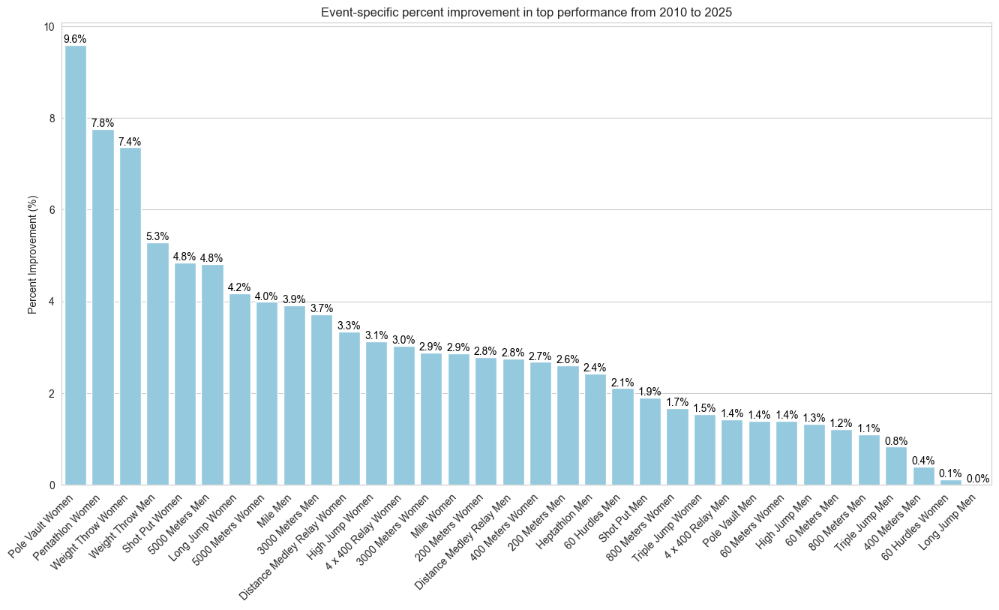

In [476]:
import matplotlib.pyplot as plt
import seaborn as sns

# Replace underscores with spaces in event names for better readability
df_1_overall_improvement["event"] = df_1_overall_improvement["event"].str.replace(
    "_", " "
)

# Set figure size
plt.figure(figsize=(16, 8))

# Create bar plot
ax = sns.barplot(
    data=df_1_overall_improvement.sort_values("spread_pct", ascending=False),
    x="event",
    y="spread_pct",
    color="skyblue",
)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha="right")

# Add labels and title
plt.xlabel("")  # No x-axis title
plt.ylabel("Percent Improvement (%)")
plt.title("Event-specific percent improvement in top performance from 2010 to 2025")

# Add data labels on bars
for p in ax.patches:
    ax.annotate(
        f"{p.get_height():.1f}%",
        (p.get_x() + p.get_width() / 2.0, p.get_height()),
        ha="center",
        va="bottom",
        fontsize=10,
        color="black",
    )

# Show plot
plt.show()


In [450]:
import numpy as np

df_1_overall_improvement["mark_new_2040"] = df_1_overall_improvement.apply(
    lambda row: row["mark_new_2025"] - (row["spread_pct"] / 100 * row["mark_new_2025"])
    if (row["event_type"] == "running") or (row["event_type"] == "relay")
    else row["mark_new_2025"] + (row["spread_pct"] / 100 * row["mark_new_2025"])
    if row["event_type"] in ["field", "athlon"]
    else None,
    axis=1,
)

df_1_overall_improvement["test"] = df_1_overall_improvement.apply(
    lambda row: row["mark_new_2010"] - (row["spread_pct"] / 100 * row["mark_new_2010"])
    if (row["event_type"] == "running") or (row["event_type"] == "relay")
    else row["mark_new_2010"] + (row["spread_pct"] / 100 * row["mark_new_2010"])
    if row["event_type"] in ["field", "athlon"]
    else None,
    axis=1,
)


def seconds_to_min_sec(seconds):
    minutes = int(seconds) // 60
    sec = seconds % 60
    return f"{minutes}:{sec:05.2f}"  # Ensures two decimal places


df_1_overall_improvement["2040 Top Performance"] = df_1_overall_improvement.apply(
    lambda row: seconds_to_min_sec(row["mark_new_2040"])
    if (row["event_type"] == "running") or (row["event_type"] == "relay")
    else np.round(row["mark_new_2040"], 2)
    if row["event_type"] == "field"
    else int(row["mark_new_2040"])
    if row["event_type"] == "athlon"
    else None,
    axis=1,
)

df_1_overall_improvement[["event", "2040 Top Performance"]]

,event,2040 Top Performance
0,60 Meters Men,0:06.43
1,60 Meters Women,0:06.98
2,200 Meters Men,0:19.60
3,200 Meters Women,0:21.72
4,400 Meters Men,0:44.67
5,400 Meters Women,0:48.45
6,800 Meters Men,1:44.03
7,800 Meters Women,1:57.44
8,Mile Men,3:39.38
9,Mile Women,4:15.90


In [417]:
df_12_overall_improvement = df_12_place[df_12_place["year"] == "2010"].merge(
    df_12_place[df_12_place["year"] == "2025"],
    how="inner",
    on=["event", "event_type"],
    suffixes=["_2010", "_2025"],
)

df_12_overall_improvement["spread"] = abs(
    df_12_overall_improvement["mark_new_2010"]
    - df_12_overall_improvement["mark_new_2025"]
)
df_12_overall_improvement["spread_pct"] = (
    df_12_overall_improvement["spread"]
    / df_12_overall_improvement["mark_new_2010"]
    * 100
)
df_12_overall_improvement[
    ["event", "mark_2010", "mark_2025", "spread_pct"]
].sort_values("spread_pct", ascending=False)

,event,mark_2010,mark_2025,spread_pct
3,Distance_Medley_Relay_Women,11:11.02,10:50.15,3.110190
1,4_x_400_Relay_Women,3:35.40,3:29.97,2.520891
2,Distance_Medley_Relay_Men,9:34.29,9:21.23,2.274112
0,4_x_400_Relay_Men,3:07.61,3:04.39,1.716326


In [418]:
df_16_overall_improvement = df_16_place[df_16_place["year"] == "2010"].merge(
    df_16_place[df_16_place["year"] == "2025"],
    how="inner",
    on=["event", "event_type"],
    suffixes=["_2010", "_2025"],
)

df_16_overall_improvement["spread"] = abs(
    df_16_overall_improvement["mark_new_2010"]
    - df_16_overall_improvement["mark_new_2025"]
)
df_16_overall_improvement["spread_pct"] = (
    df_16_overall_improvement["spread"]
    / df_16_overall_improvement["mark_new_2010"]
    * 100
)
df_16_overall_improvement[
    ["event", "mark_2010", "mark_2025", "spread_pct"]
].sort_values("spread_pct", ascending=False)

,event,mark_2010,mark_2025,spread_pct
26,Weight_Throw_Men,20.80m,22.71m,9.182692
27,Weight_Throw_Women,20.04m,21.75m,8.532934
25,Shot_Put_Women,16.43m,17.63m,7.303713
28,Pentathlon_Women,3967,4183,5.444921
19,Pole_Vault_Women,4.23m,4.46m,5.437352
11,3000_Meters_Women,9:16.62,8:48.96,4.969279
24,Shot_Put_Men,18.54m,19.38m,4.530744
13,5000_Meters_Women,16:10.87,15:27.86,4.430047
9,Mile_Women,4:40.68,4:28.33,4.400029
12,5000_Meters_Men,13:53.61,13:20.76,3.940692


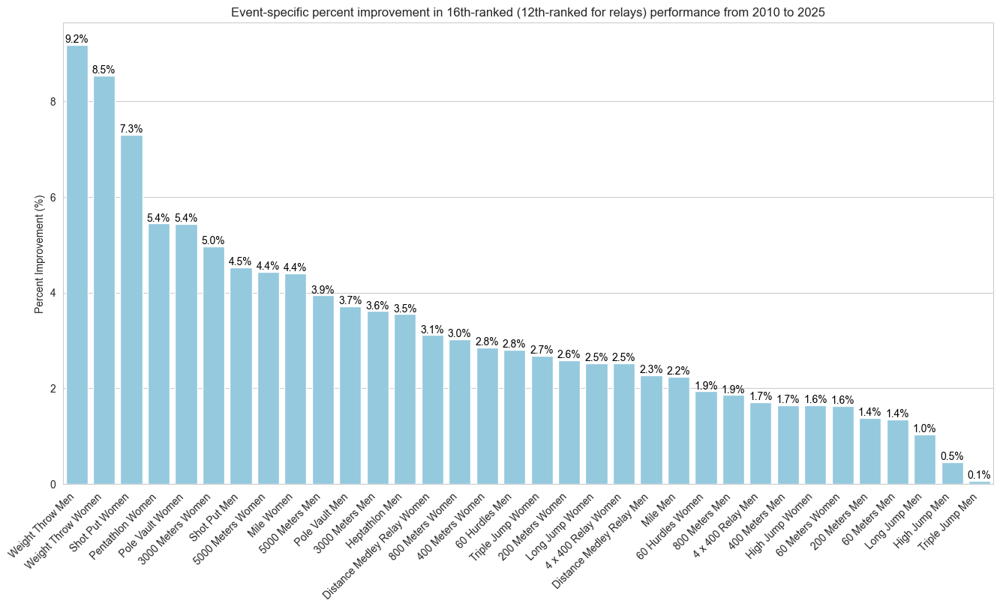

In [475]:
df_12_16_overall_improvement = pd.concat(
    [df_16_overall_improvement, df_12_overall_improvement]
).sort_values("spread_pct", ascending=False)

# Replace underscores with spaces in event names for better readability
df_12_16_overall_improvement["event"] = df_12_16_overall_improvement[
    "event"
].str.replace("_", " ")

# Set figure size
plt.figure(figsize=(16, 8))

# Create bar plot
ax = sns.barplot(
    data=df_12_16_overall_improvement.sort_values("spread_pct", ascending=False),
    x="event",
    y="spread_pct",
    color="skyblue",
)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha="right")

# Add labels and title
plt.xlabel("")  # No x-axis title
plt.ylabel("Percent Improvement (%)")
plt.title(
    "Event-specific percent improvement in 16th-ranked (12th-ranked for relays) performance from 2010 to 2025"
)

# Add data labels on bars
for p in ax.patches:
    ax.annotate(
        f"{p.get_height():.1f}%",
        (p.get_x() + p.get_width() / 2.0, p.get_height()),
        ha="center",
        va="bottom",
        fontsize=10,
        color="black",
    )

# Show plot
plt.show()

In [ ]:
df_12_16_overall_improvement["mark_new_2040"] = df_12_16_overall_improvement.apply(
    lambda row: row["mark_new_2025"] - (row["spread_pct"] / 100 * row["mark_new_2025"])
    if (row["event_type"] == "running") or (row["event_type"] == "relay")
    else row["mark_new_2025"] + (row["spread_pct"] / 100 * row["mark_new_2025"])
    if row["event_type"] in ["field", "athlon"]
    else None,
    axis=1,
)

df_12_16_overall_improvement["test"] = df_12_16_overall_improvement.apply(
    lambda row: row["mark_new_2010"] - (row["spread_pct"] / 100 * row["mark_new_2010"])
    if (row["event_type"] == "running") or (row["event_type"] == "relay")
    else row["mark_new_2010"] + (row["spread_pct"] / 100 * row["mark_new_2010"])
    if row["event_type"] in ["field", "athlon"]
    else None,
    axis=1,
)

df_12_16_overall_improvement["2040 16th/12th-ranked Performance"] = (
    df_12_16_overall_improvement.apply(
        lambda row: seconds_to_min_sec(row["mark_new_2040"])
        if (row["event_type"] == "running") or (row["event_type"] == "relay")
        else np.round(row["mark_new_2040"], 2)
        if row["event_type"] == "field"
        else int(row["mark_new_2040"])
        if row["event_type"] == "athlon"
        else None,
        axis=1,
    )
)

df_1_overall_improvement[["event", "2040 Top Performance"]].merge(
    df_12_16_overall_improvement[["event", "2040 16th/12th-ranked Performance"]],
    how="inner",
    on="event",
).to_csv("performances_2040.csv")

In [ ]:
df_12_16_overall_improvement[["event", "2040 16th/12th-ranked Performance"]]

In [328]:
df_spread = df_1_place.merge(
    df_16_place, how="inner", on=["event", "event_type", "year"], suffixes=["_1", "_16"]
)

df_spread["spread"] = abs(df_spread["mark_new_16"] - df_spread["mark_new_1"])
df_spread["spread_pct"] = df_spread["spread"] / df_spread["mark_new_16"] * 100

,event,event_type,year,row_num_1,mark_1,mark_new_1,row_num_16,mark_16,mark_new_16,spread,spread_pct
0,60_Meters_Men,running,2010,1,6.59,6.59,16,6.66,6.66,0.07,1.051051
1,60_Meters_Men,running,2011,1,6.54,6.54,16,6.65,6.65,0.11,1.654135
2,60_Meters_Men,running,2012,1,6.54,6.54,16,6.66,6.66,0.12,1.801802
3,60_Meters_Men,running,2013,1,6.54,6.54,16,6.66,6.66,0.12,1.801802
4,60_Meters_Men,running,2014,1,6.55,6.55,16,6.63,6.63,0.08,1.206637


In [329]:
df_spread.groupby("event").aggregate({"spread_pct": ["min", "max", "mean"]})

spread_pct                      
                          min        max       mean
event                                              
200_Meters_Men       1.195029   2.657005   1.989442
200_Meters_Women     1.384083   4.948365   2.920127
3000_Meters_Men      1.173219   2.570558   1.863255
3000_Meters_Women    1.098279   4.253171   2.841768
400_Meters_Men       0.690697   3.348358   2.415055
400_Meters_Women     1.383886   4.372516   3.083815
5000_Meters_Men      0.900770   4.870631   2.122463
5000_Meters_Women    2.041348   5.126312   3.375223
60_Hurdles_Men       1.161290   4.381443   2.830735
60_Hurdles_Women     1.730532   5.121951   3.080477
60_Meters_Men        0.913242   2.118003   1.611958
60_Meters_Women      1.517241   3.013699   2.088404
800_Meters_Men       0.915802   2.996393   1.916702
800_Meters_Women     1.468476   5.536940   2.673537
Heptathlon_Men       4.090989  12.134791   7.881744
High_Jump_Men        2.727273   5.909091   4.169064
High_Jump_Women      2.747253   8.241758   5.400338
Long_Jump_Men        3.201024   8.463542   5.600284
Long_Jump_Women      3.508772   8.137715   6.306903
Mile_Men             0.648075   3.107915   1.924897
Mile_Women           1.436938   3.528773   2.667527
Pentathlon_Women     5.216346  16.641376  11.156241
Pole_Vault_Men       2.788104  10.701107   5.962932
Pole_Vault_Women     5.568445  11.241218   7.513153
Shot_Put_Men         5.848861  16.073355  10.609099
Shot_Put_Women       6.049822  14.328181  10.729715
Triple_Jump_Men      3.461296   8.908407   5.942807
Triple_Jump_Women    4.511278  10.831426   7.372594
Weight_Throw_Men     9.124595  19.588593  12.094903
Weight_Throw_Women   5.629771  16.283435  11.290457

60_Meters_Men


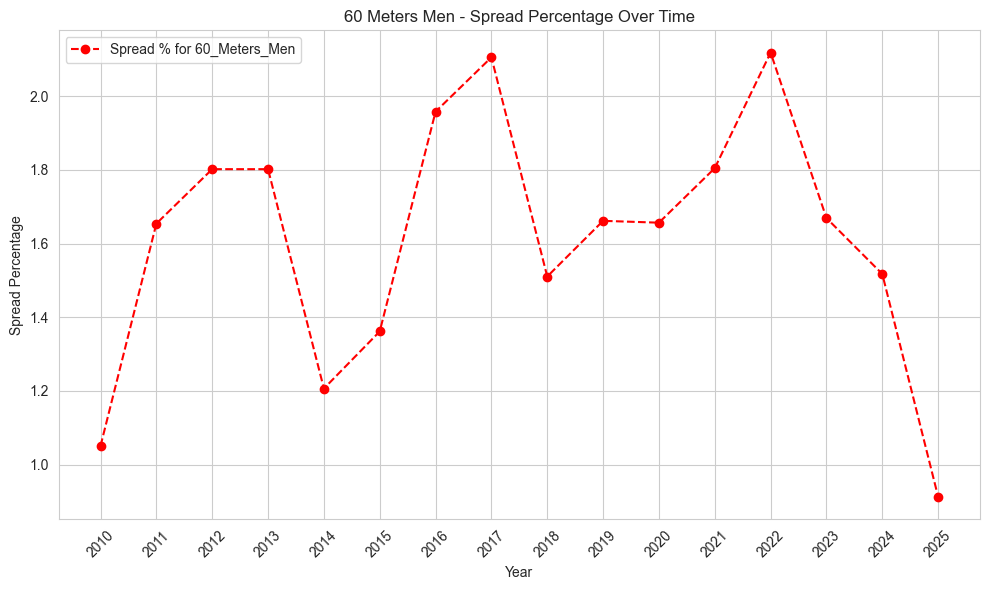

60_Meters_Women


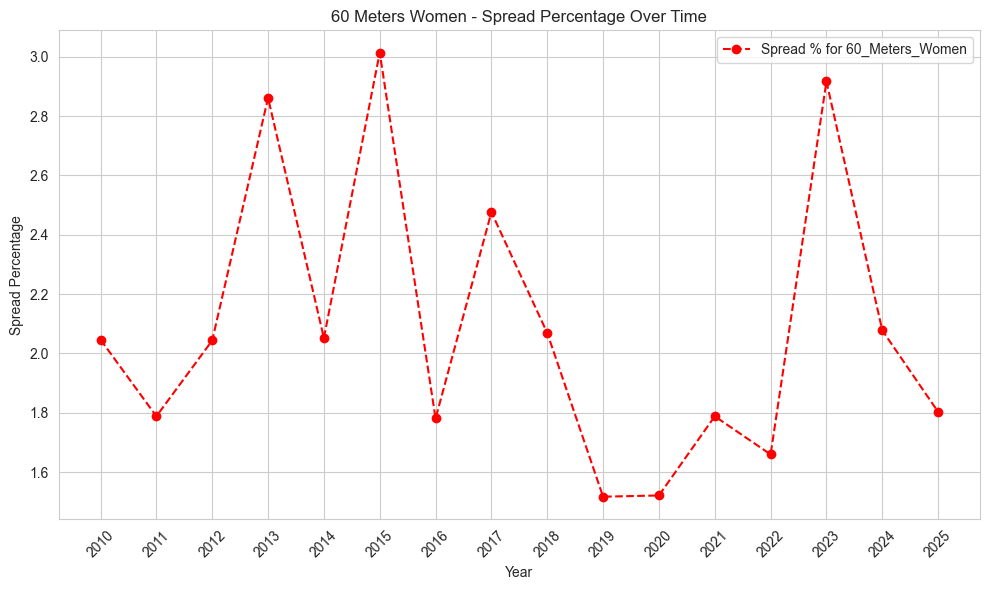

200_Meters_Men


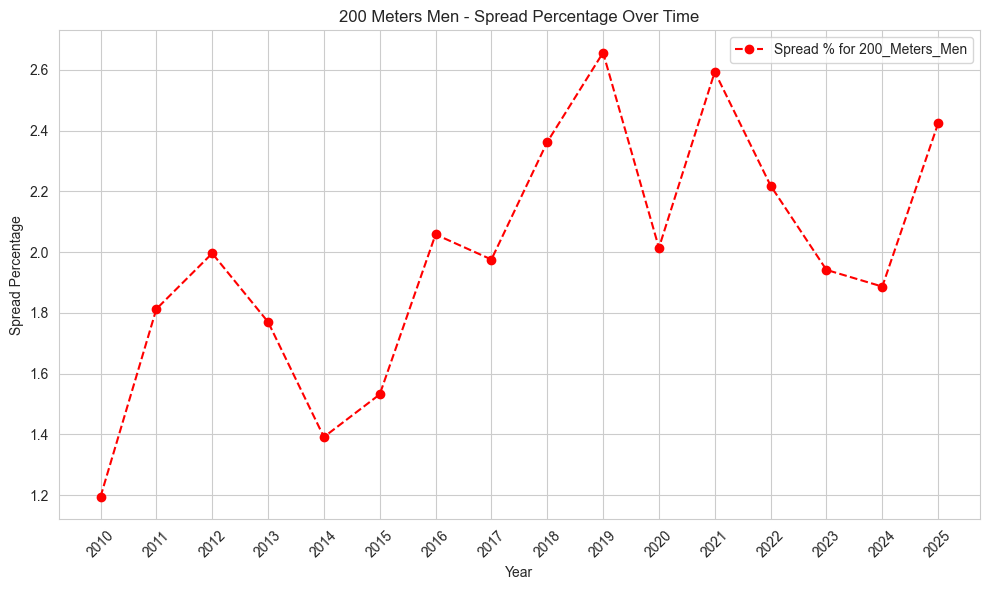

200_Meters_Women


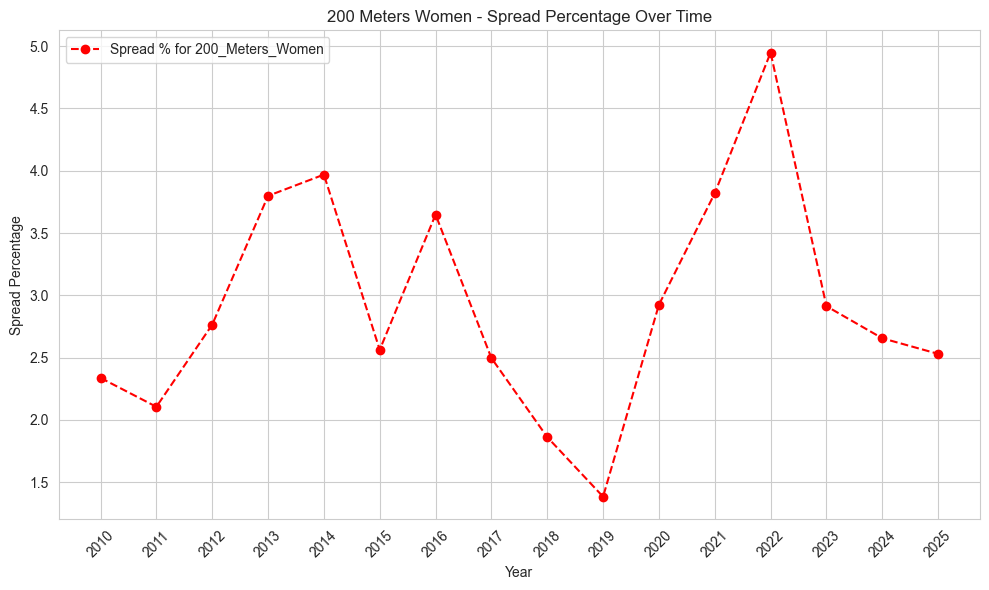

400_Meters_Men


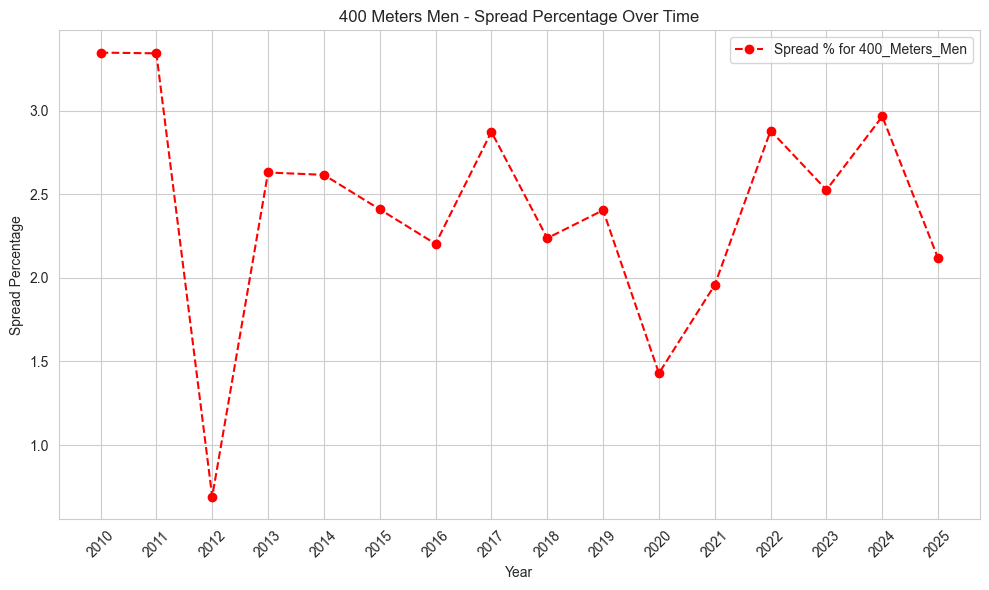

400_Meters_Women


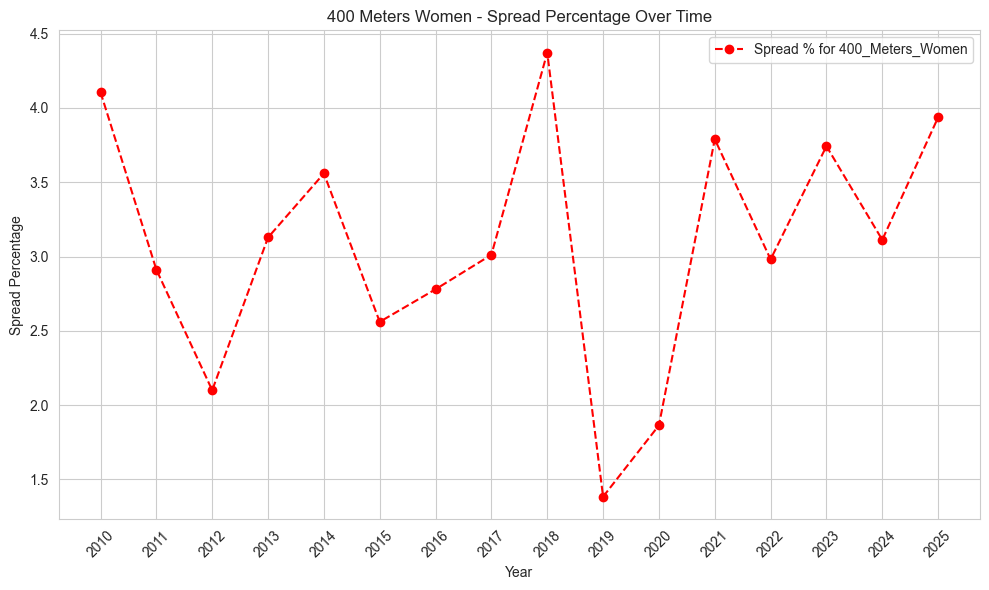

800_Meters_Men


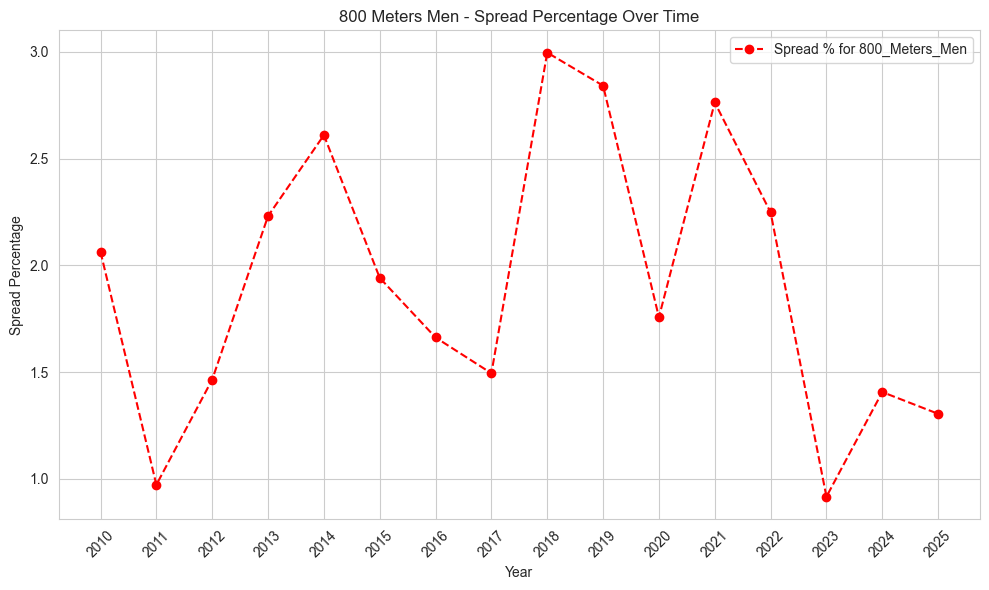

800_Meters_Women


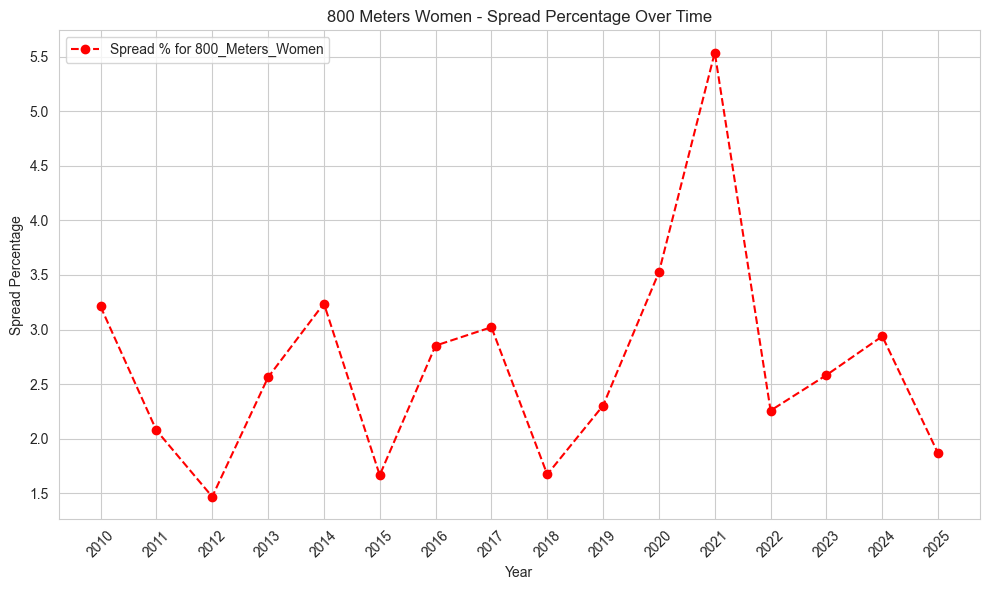

Mile_Men


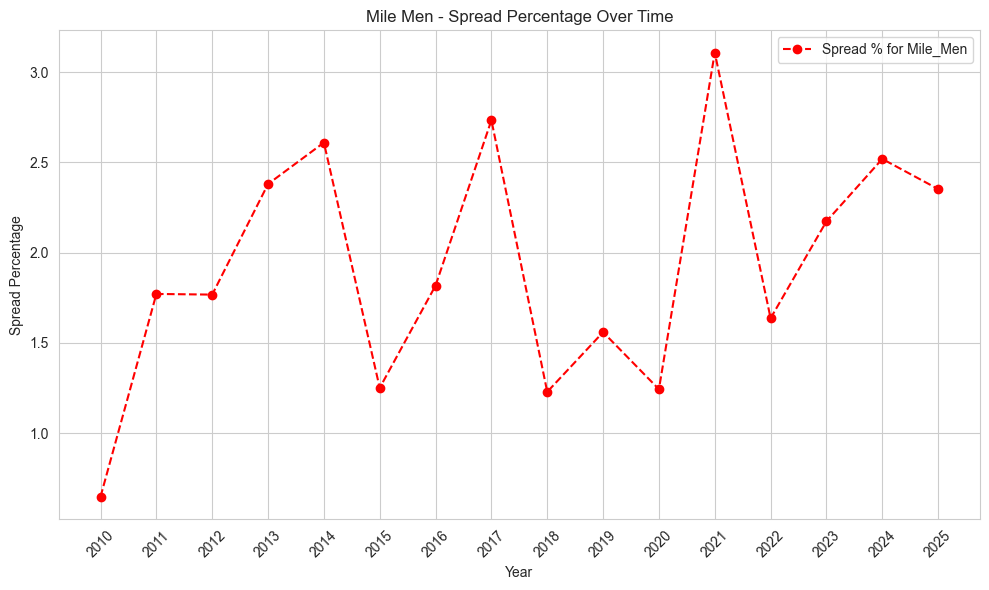

Mile_Women


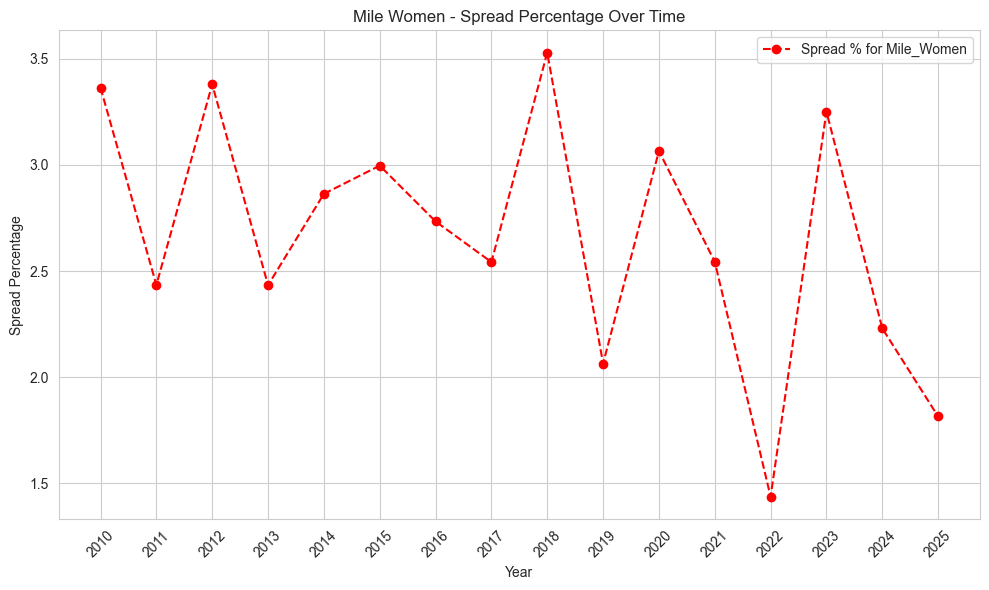

3000_Meters_Men


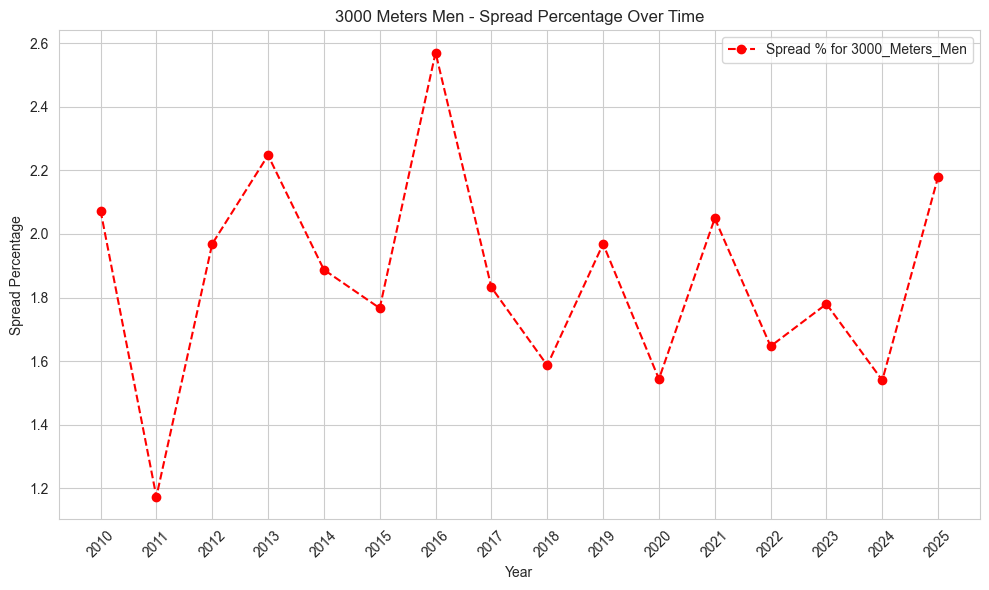

3000_Meters_Women


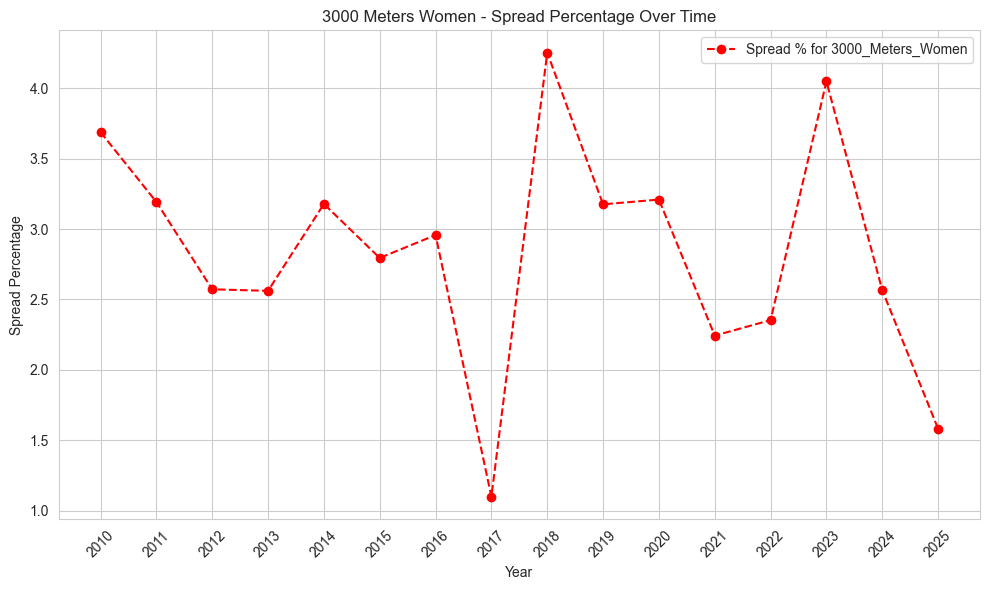

5000_Meters_Men


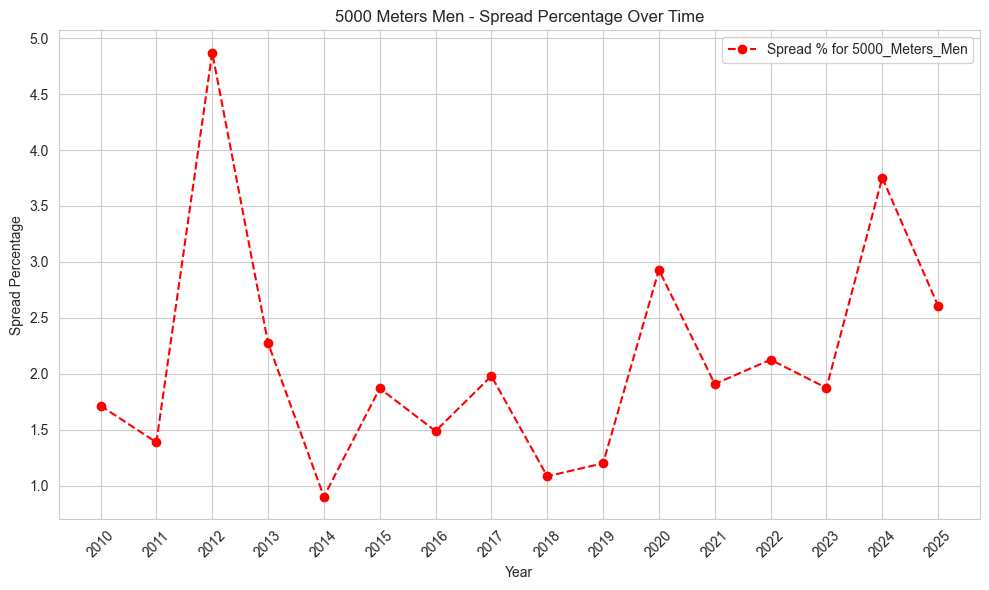

5000_Meters_Women


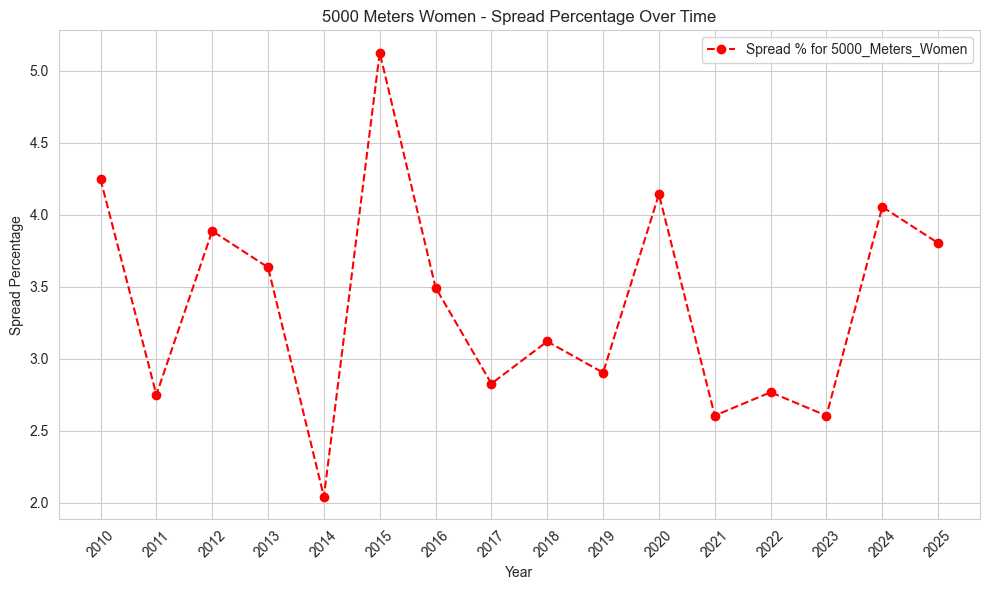

60_Hurdles_Men


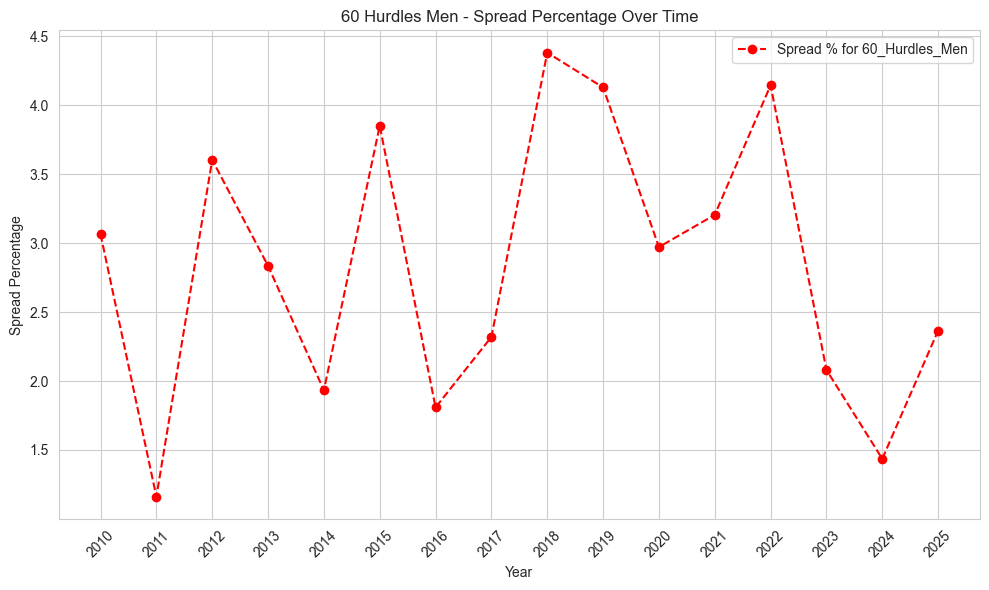

60_Hurdles_Women


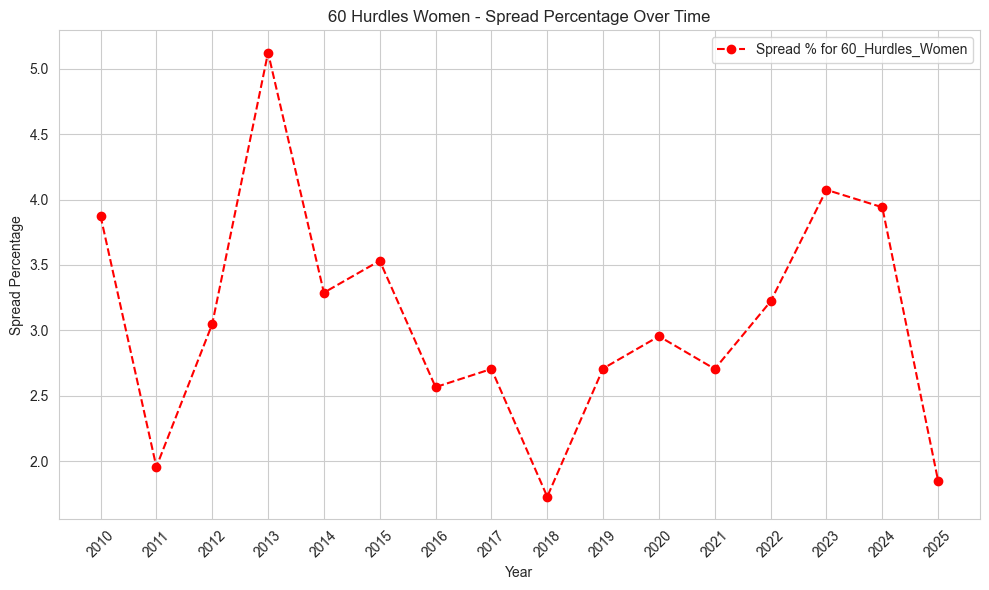

4_x_400_Relay_Men


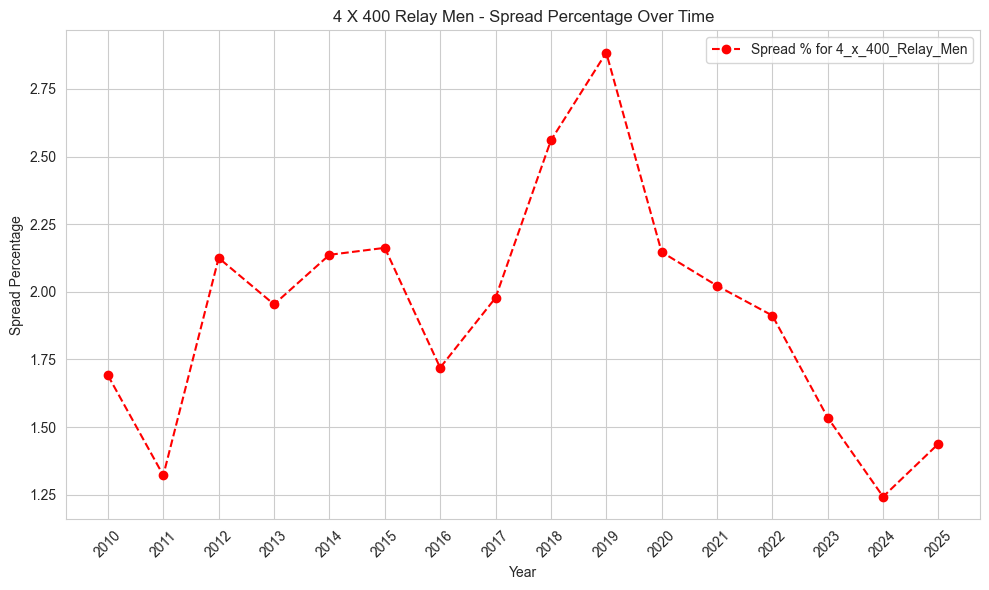

4_x_400_Relay_Women


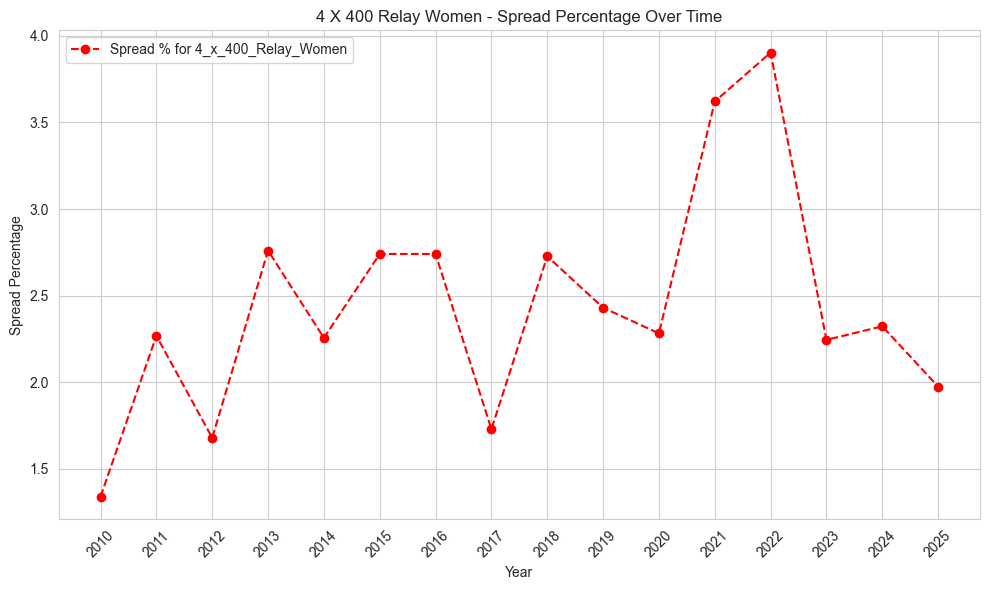

Distance_Medley_Relay_Men


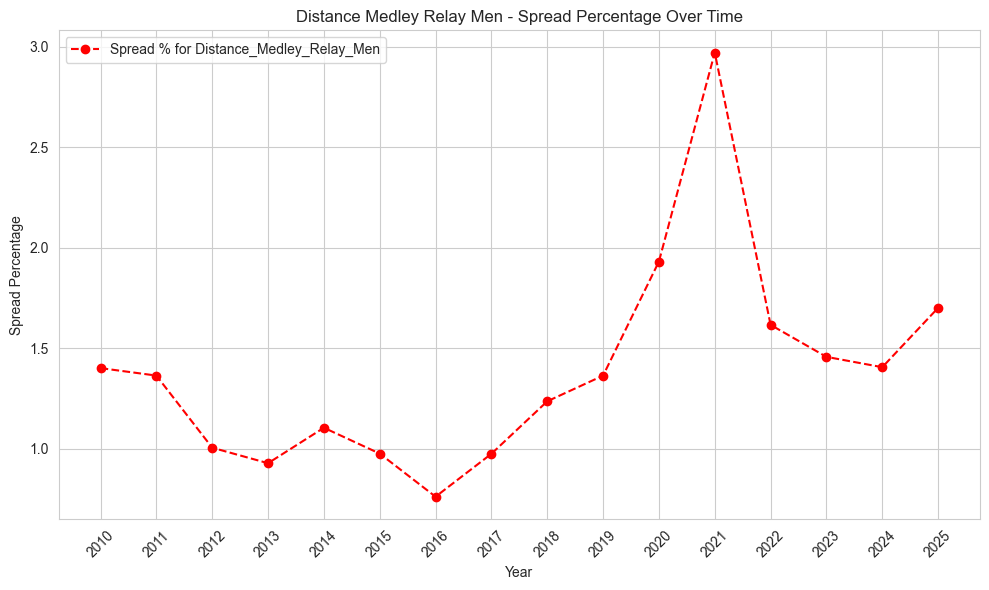

Distance_Medley_Relay_Women


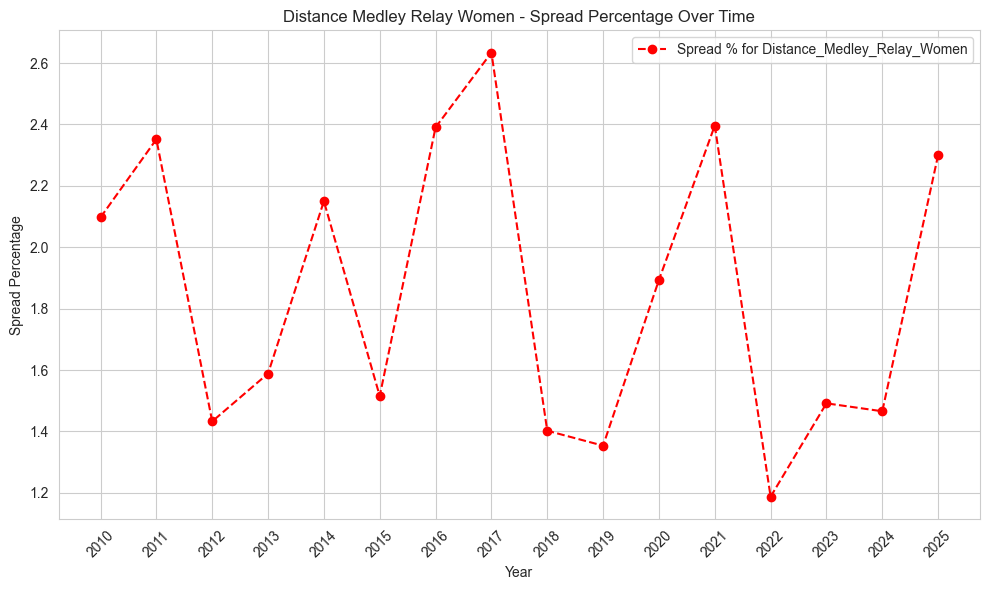

High_Jump_Men


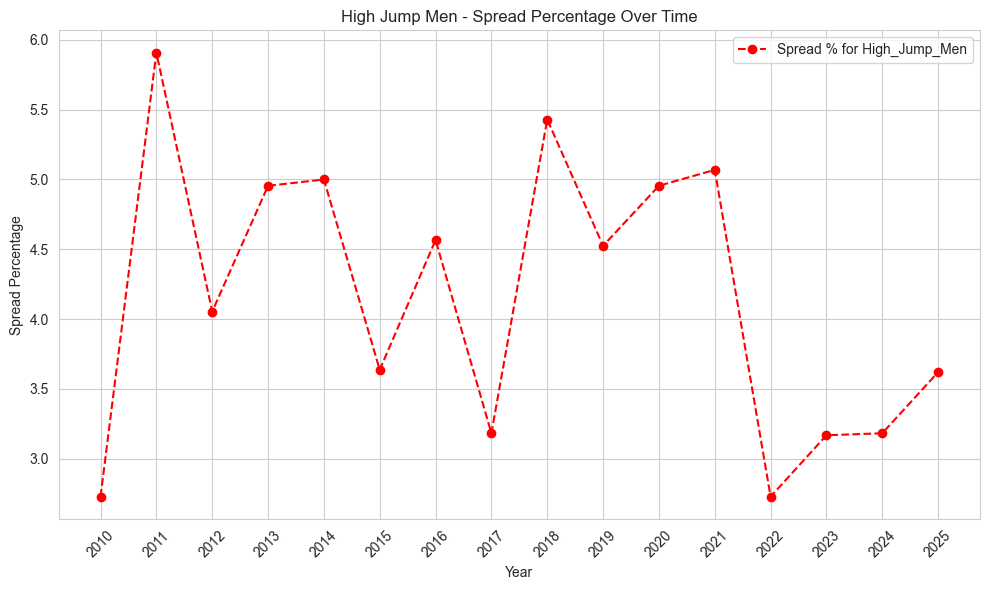

High_Jump_Women


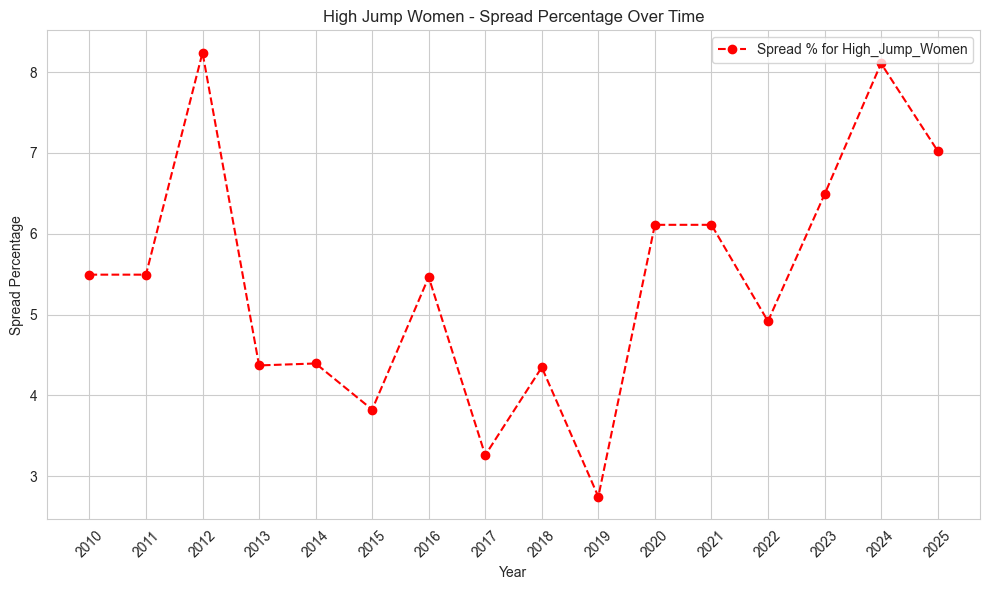

Pole_Vault_Men


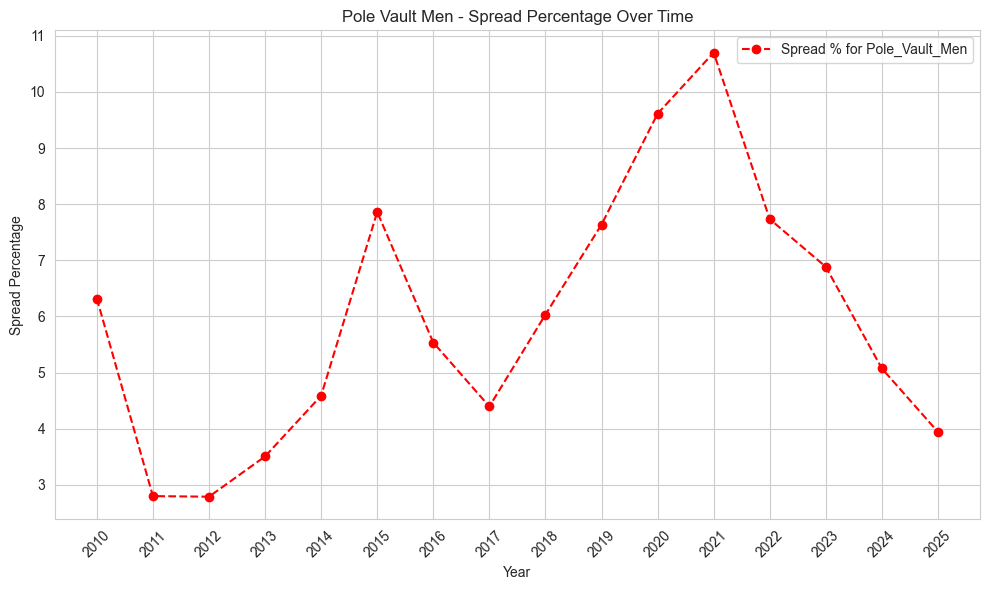

Pole_Vault_Women


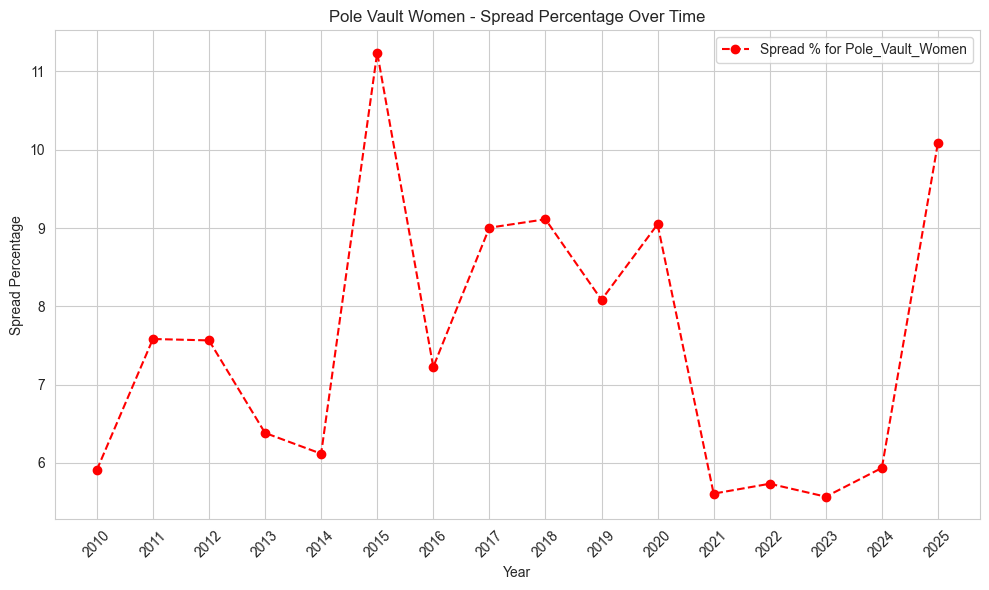

Long_Jump_Men


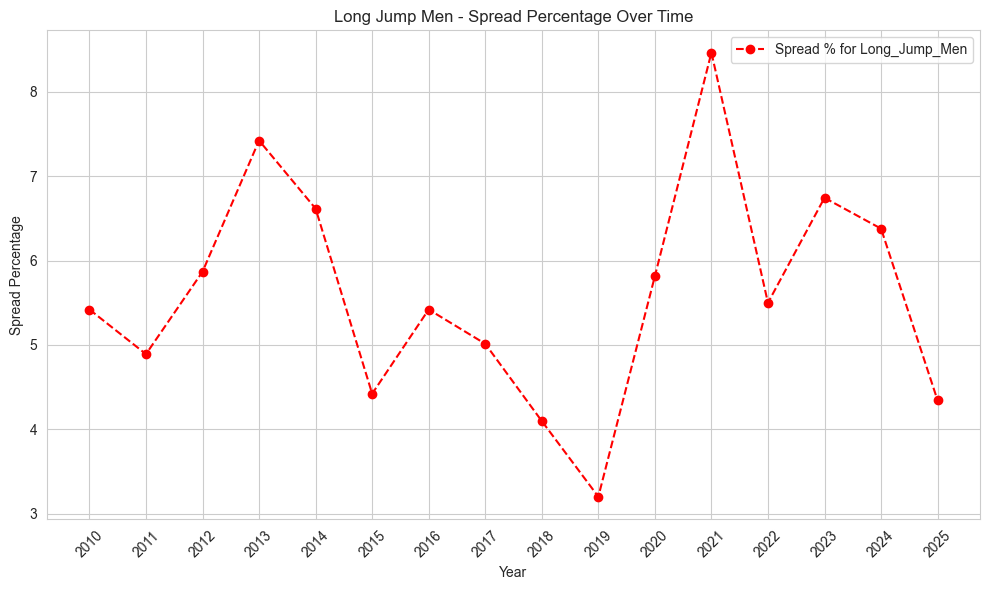

Long_Jump_Women


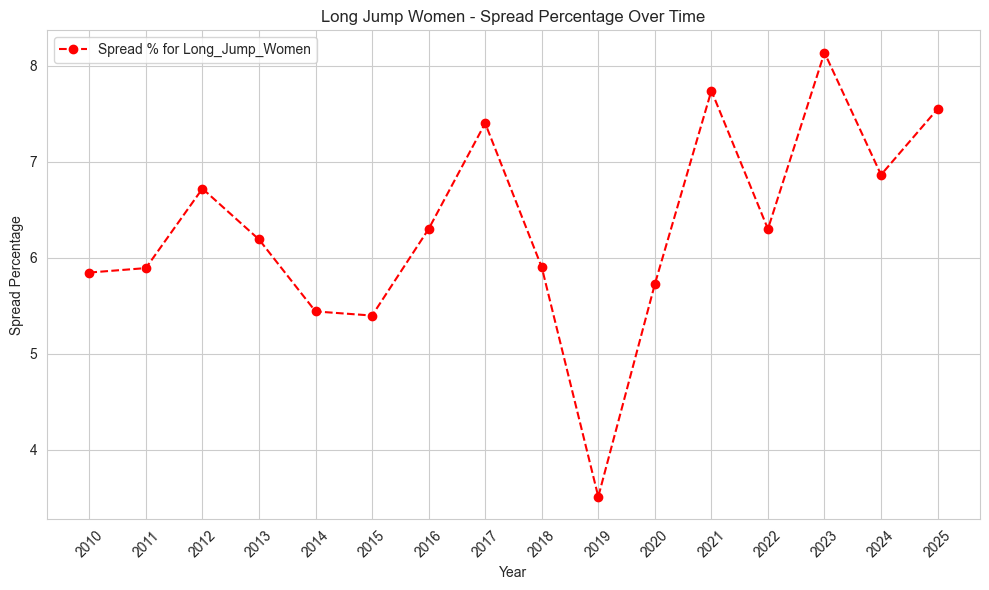

Triple_Jump_Men


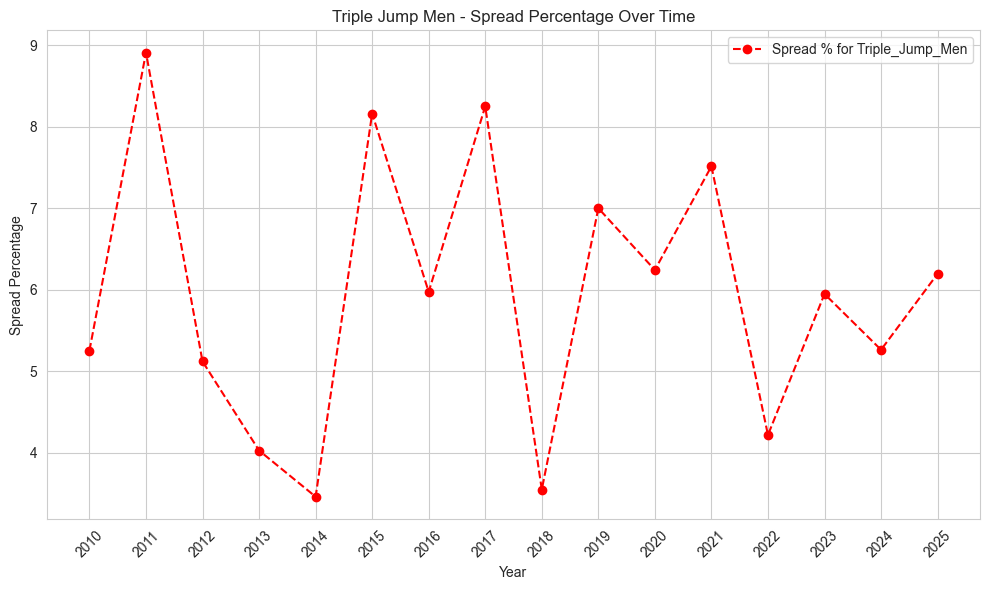

Triple_Jump_Women


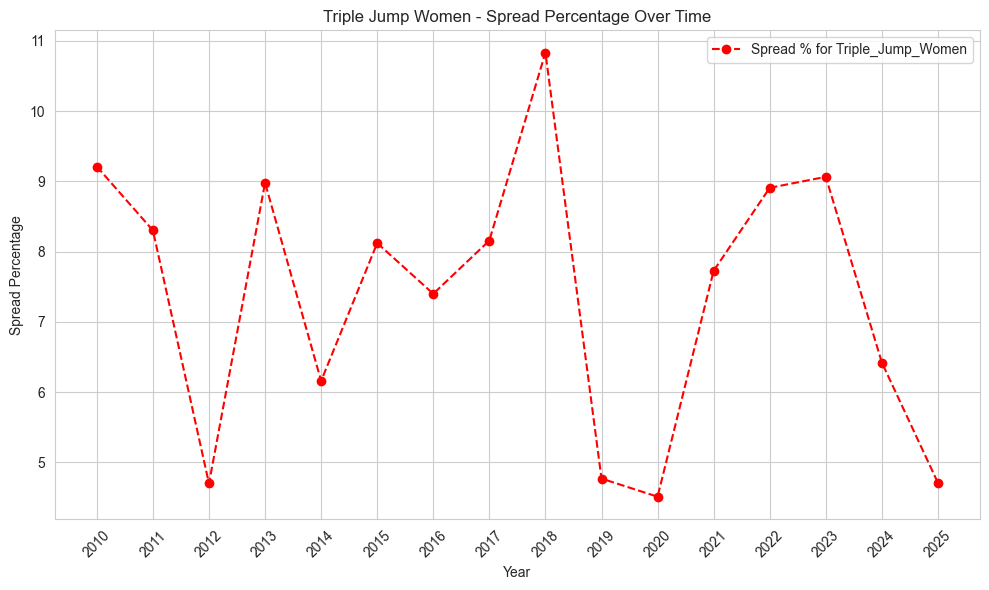

Shot_Put_Men


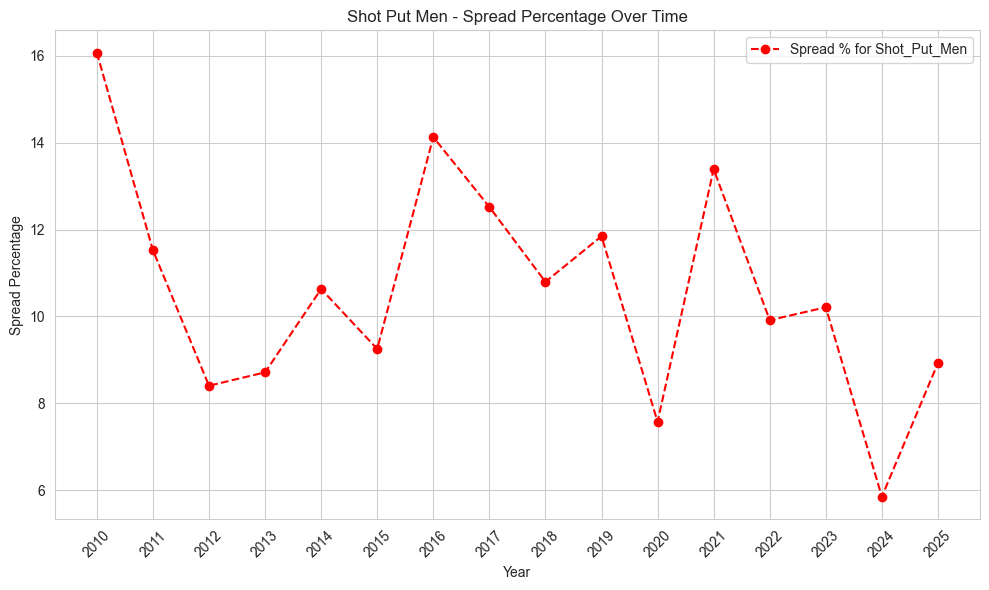

Shot_Put_Women


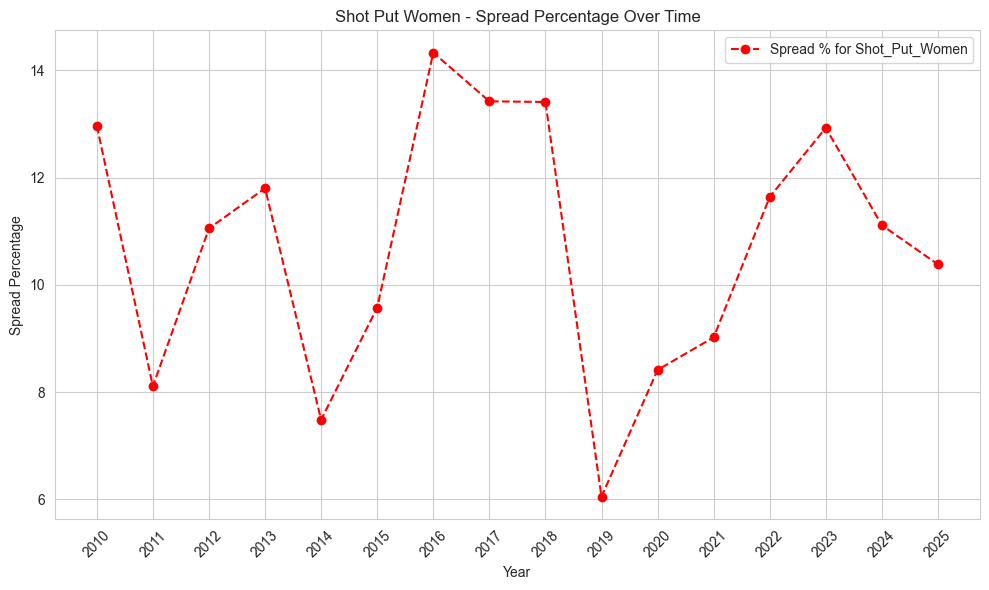

Weight_Throw_Men


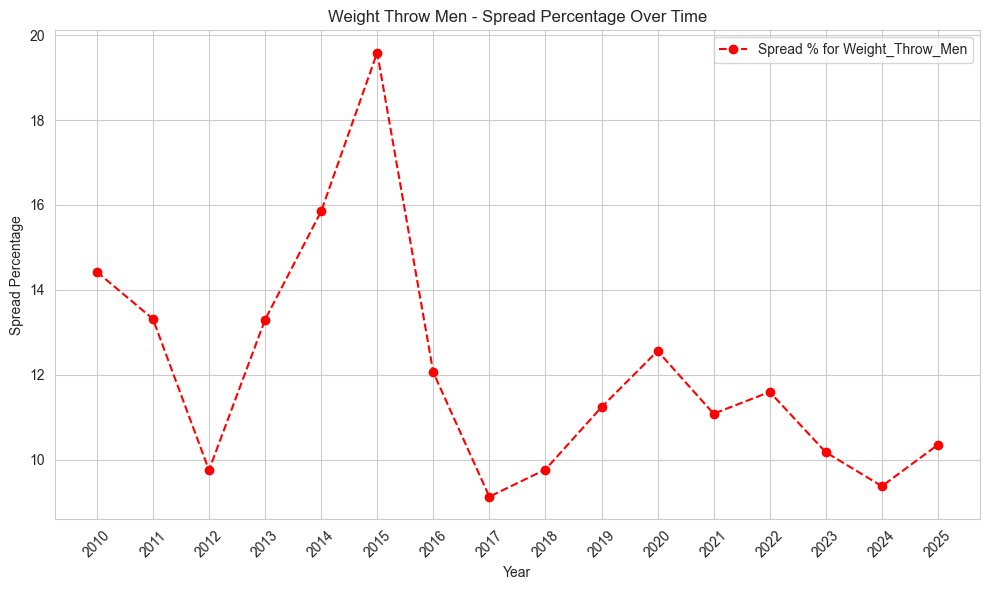

Weight_Throw_Women


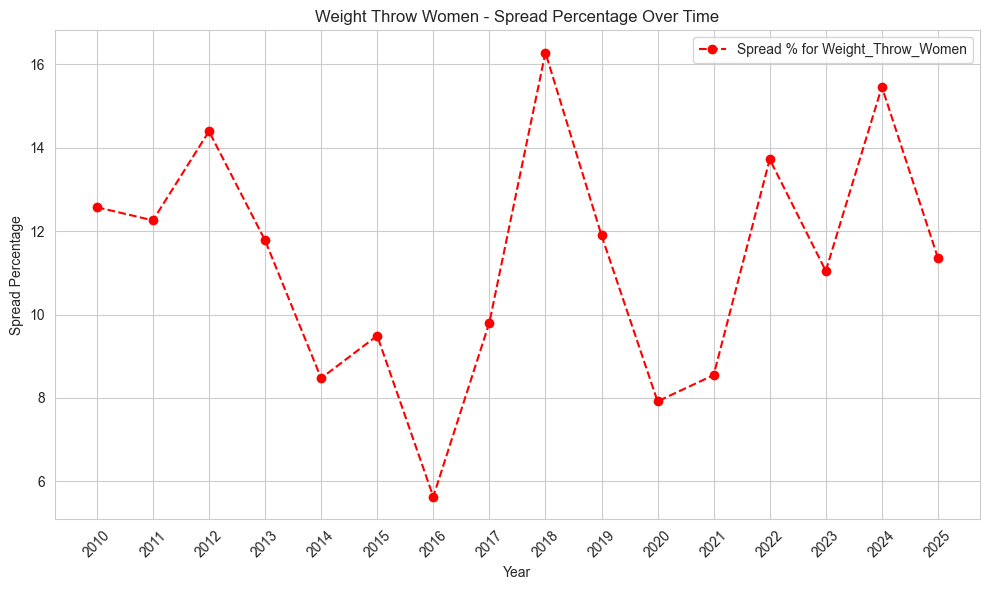

Pentathlon_Women


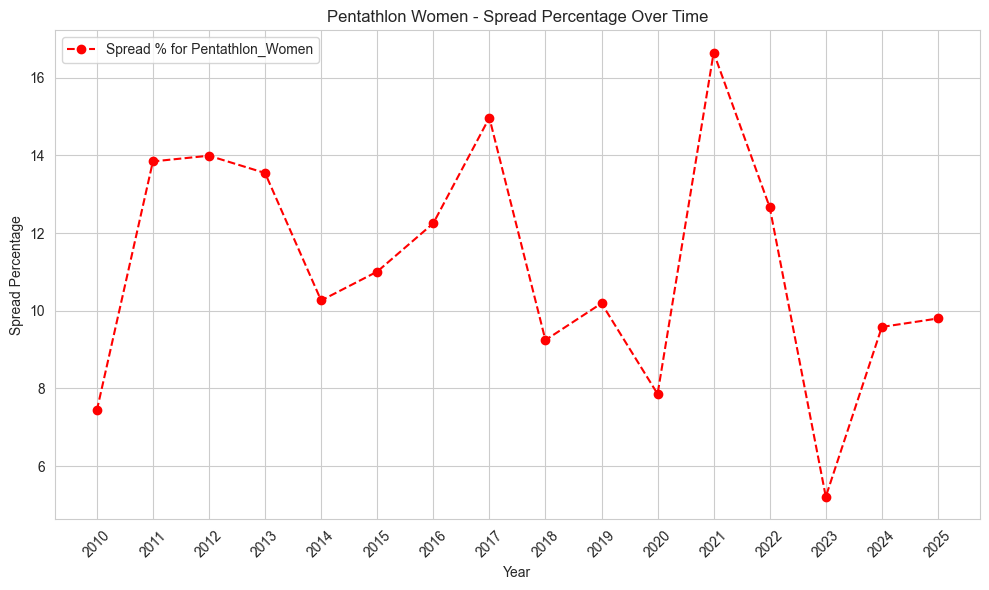

Heptathlon_Men


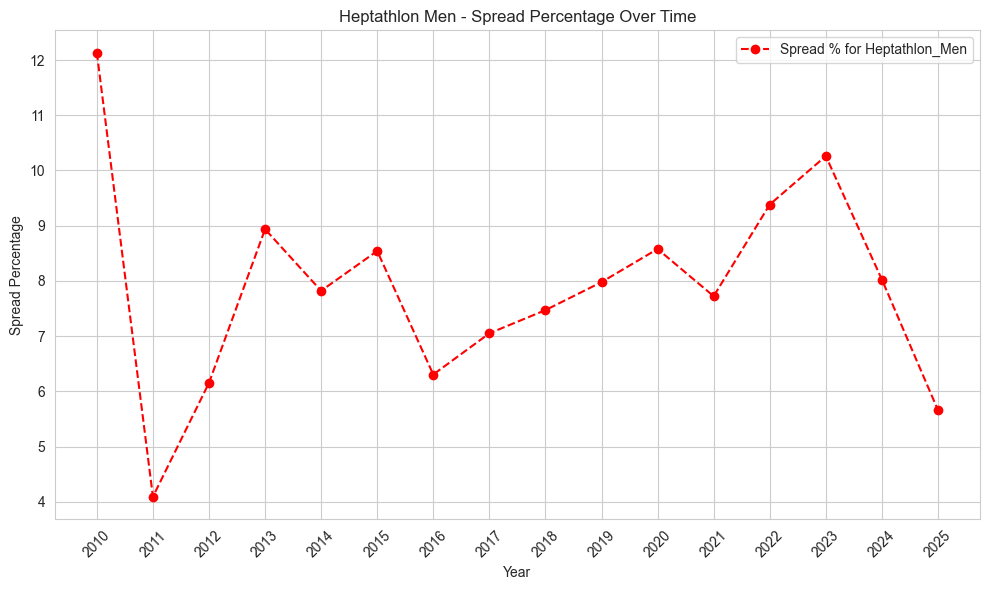

In [292]:
import matplotlib.pyplot as plt

# Loop through each unique event in df_spread
for event in df_spread["event"].unique():
    print(event)

    # Filter data for the specific event
    event_df = df_spread[df_spread["event"] == event].copy()

    # Create a line chart for 'spread_pct'
    plt.figure(figsize=(10, 6))
    plt.plot(
        event_df["year"],
        event_df["spread_pct"],
        marker="o",
        linestyle="dashed",
        color="red",
        label=f"Spread % for {event}",
    )

    # Formatting the chart
    plt.xlabel("Year")
    plt.ylabel("Spread Percentage")
    plt.title(f"{event.replace('_', ' ').title()} - Spread Percentage Over Time")
    plt.xticks(rotation=45)
    plt.legend()

    # Show the plot
    plt.tight_layout()
    plt.show()


60_Meters_Men


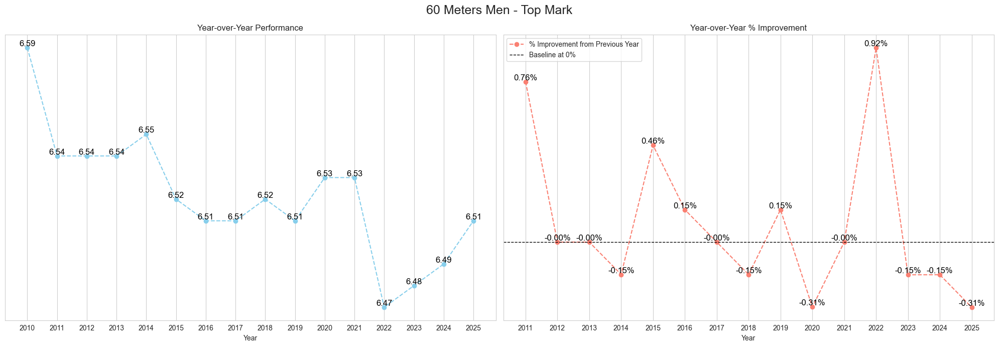

60_Meters_Women


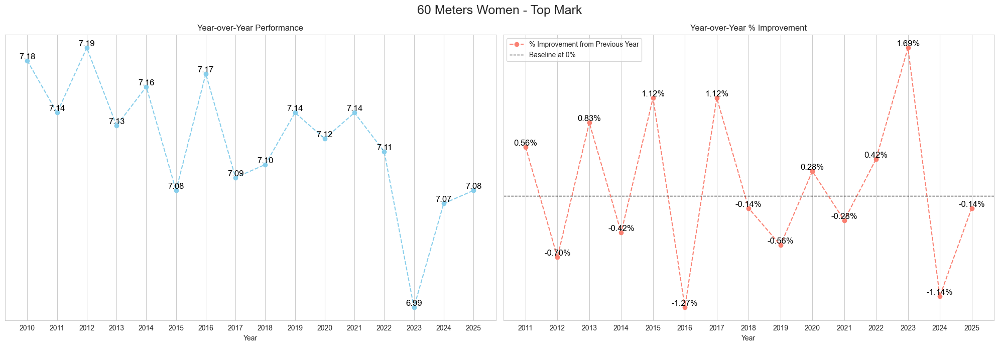

200_Meters_Men


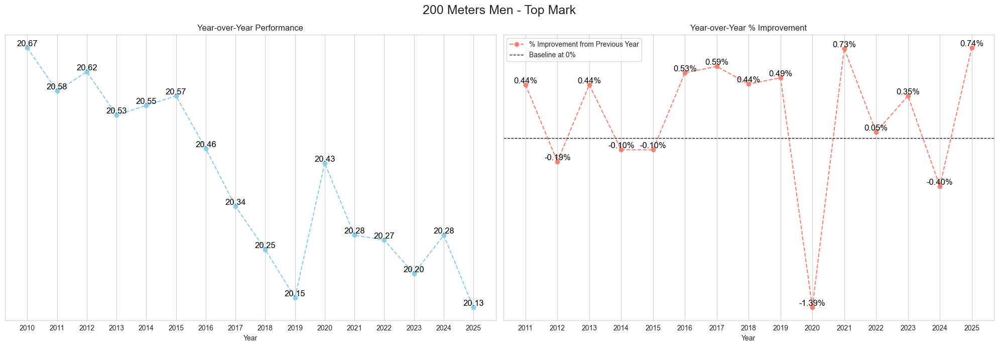

200_Meters_Women


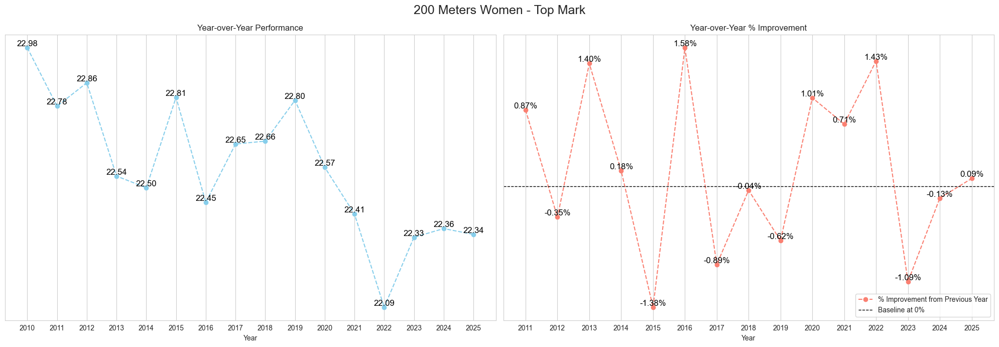

400_Meters_Men


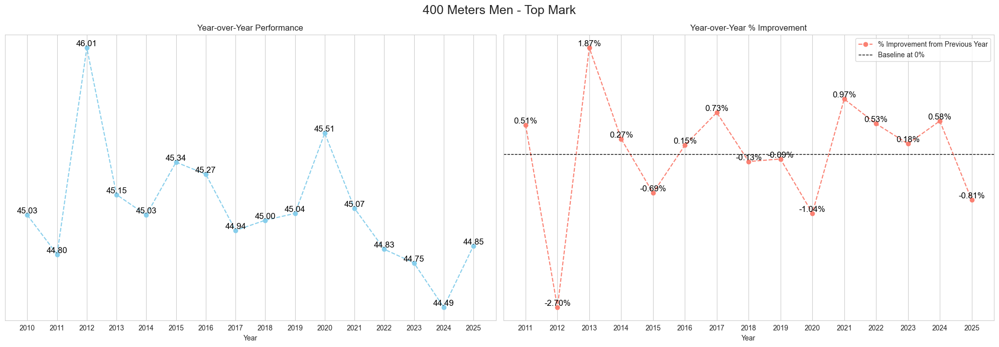

400_Meters_Women


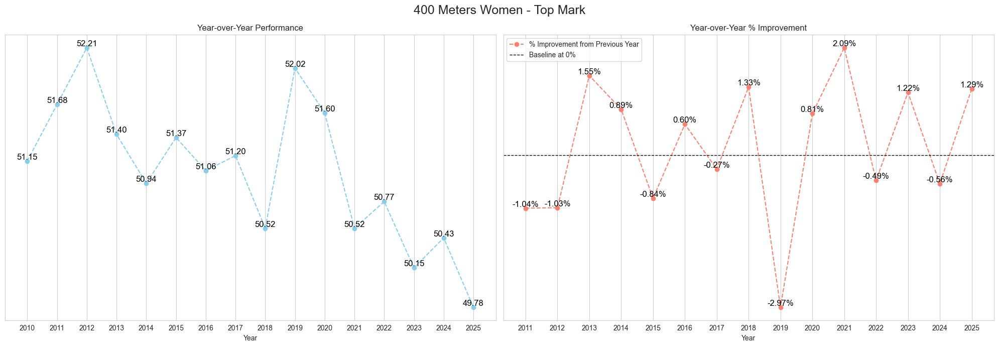

800_Meters_Men


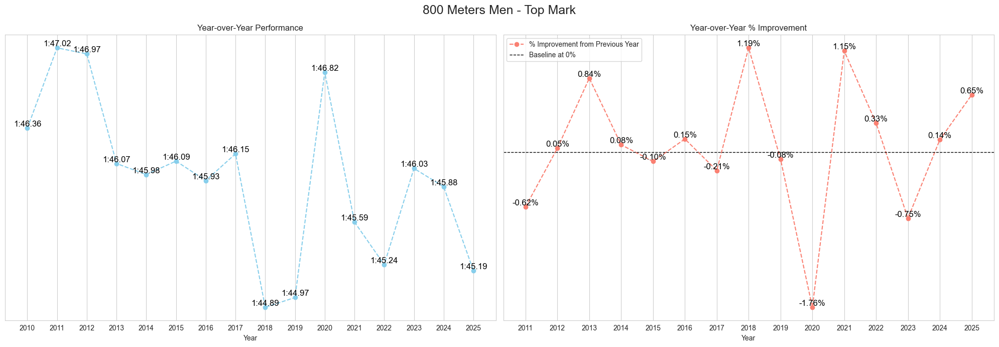

800_Meters_Women


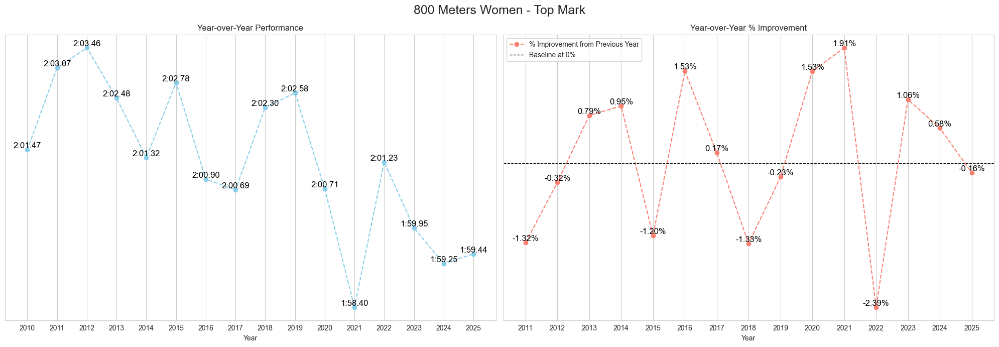

Mile_Men


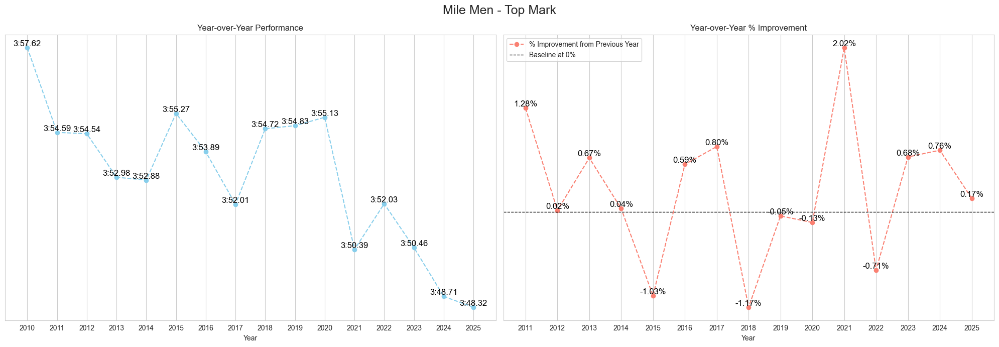

Mile_Women


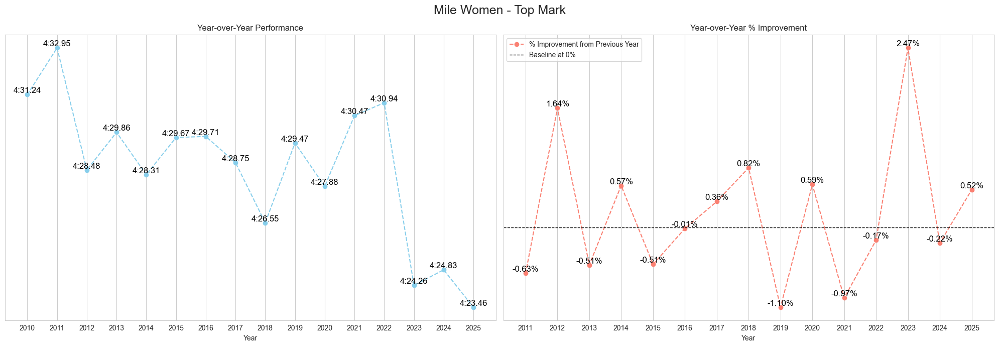

3000_Meters_Men


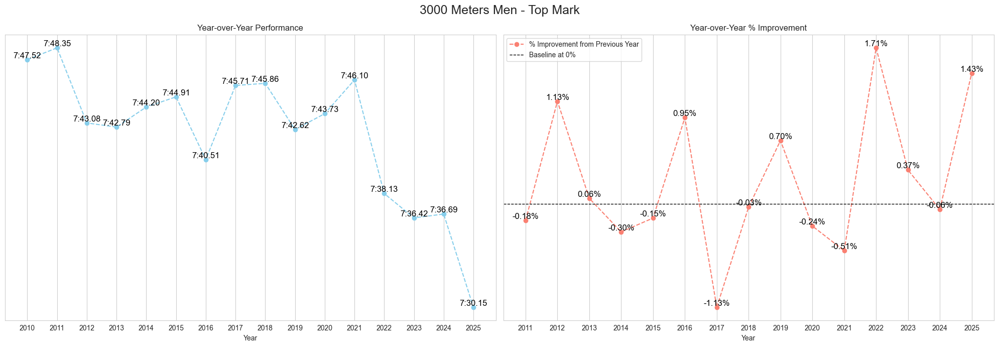

3000_Meters_Women


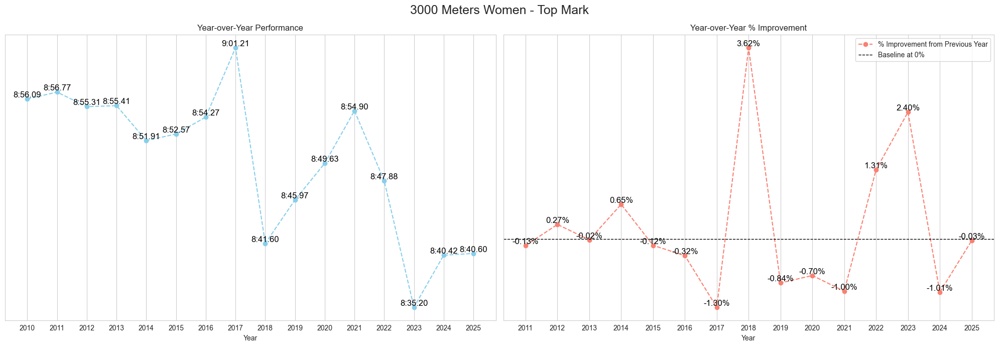

5000_Meters_Men


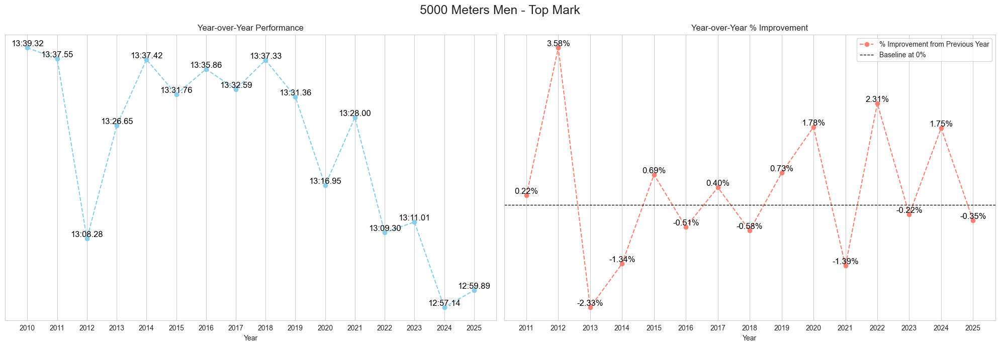

5000_Meters_Women


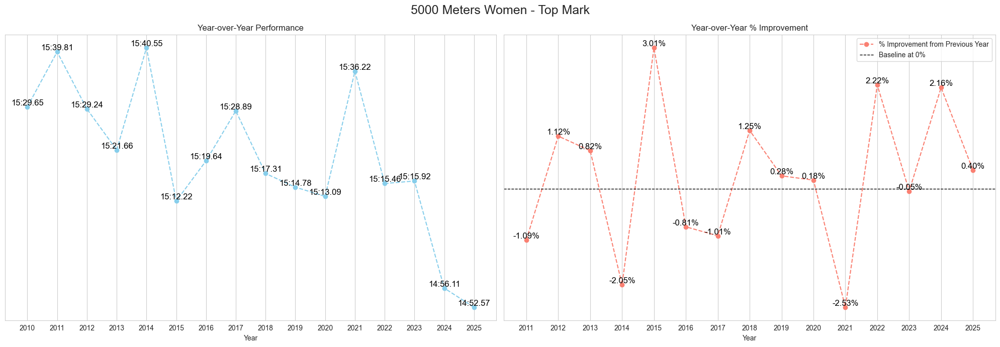

60_Hurdles_Men


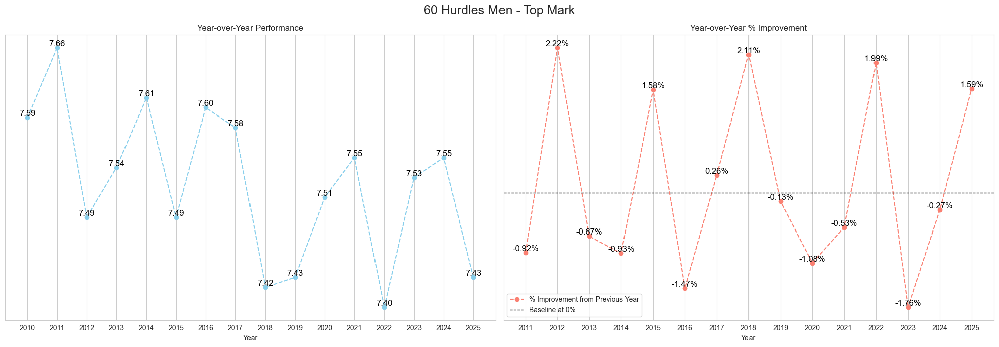

60_Hurdles_Women


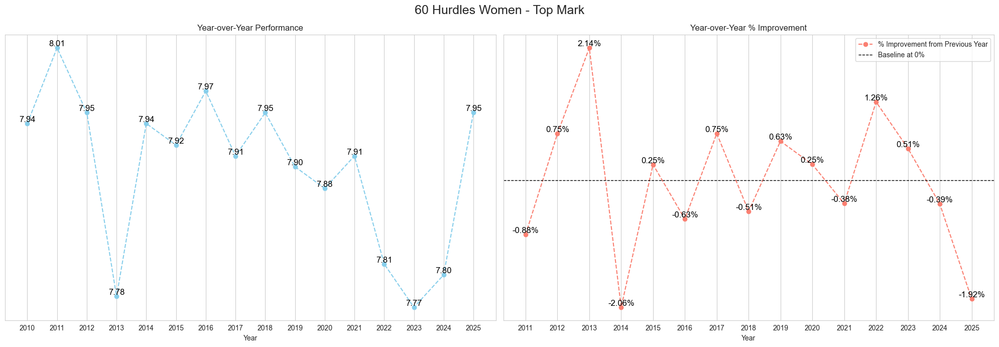

4_x_400_Relay_Men


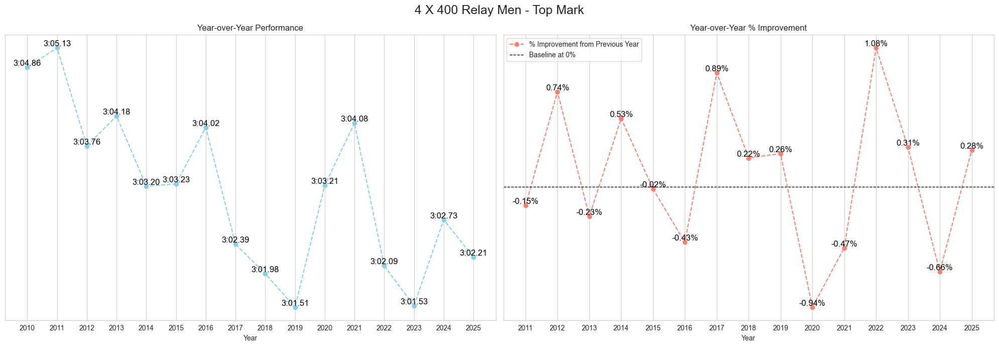

4_x_400_Relay_Women


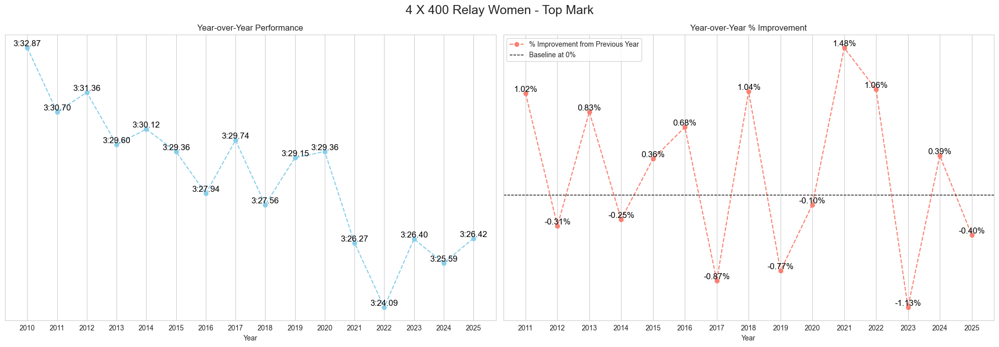

Distance_Medley_Relay_Men


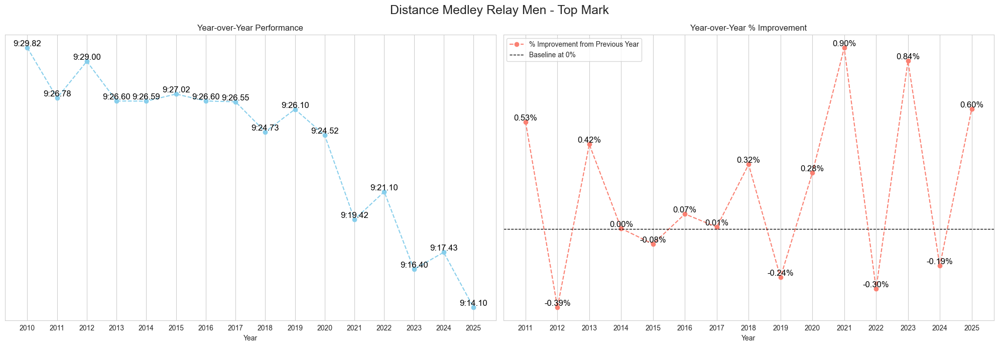

Distance_Medley_Relay_Women


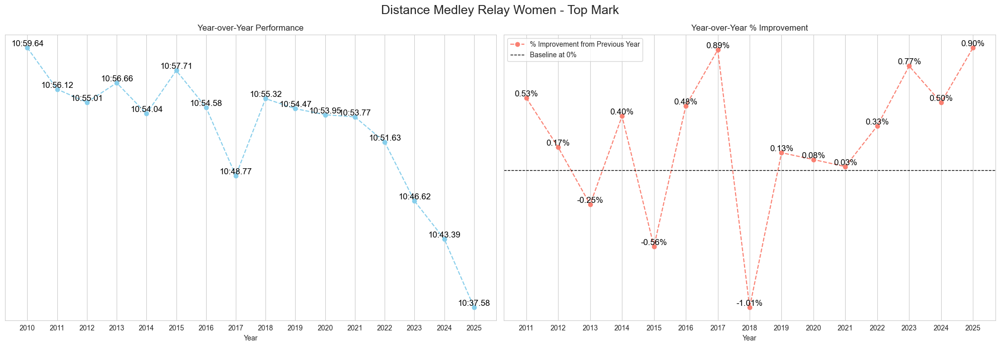

High_Jump_Men


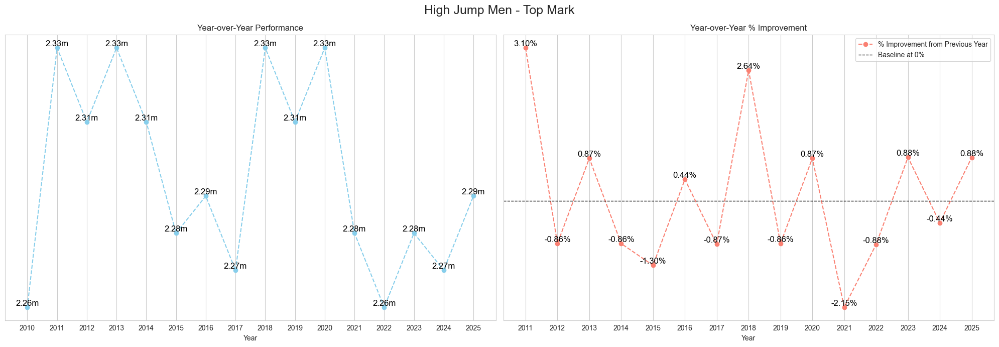

High_Jump_Women


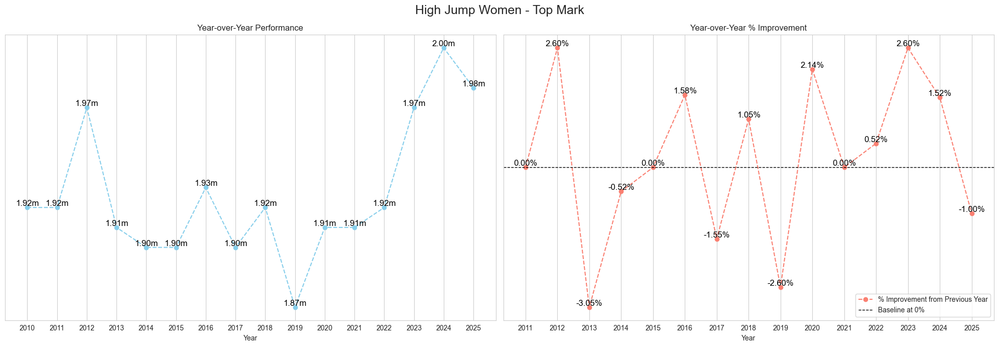

Pole_Vault_Men


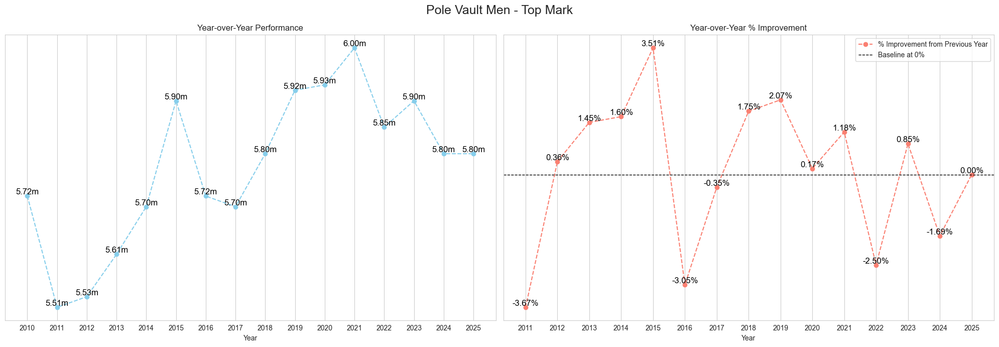

Pole_Vault_Women


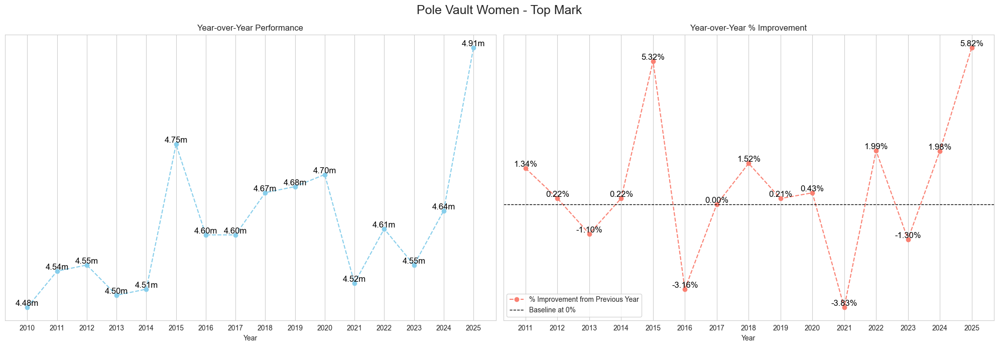

Long_Jump_Men


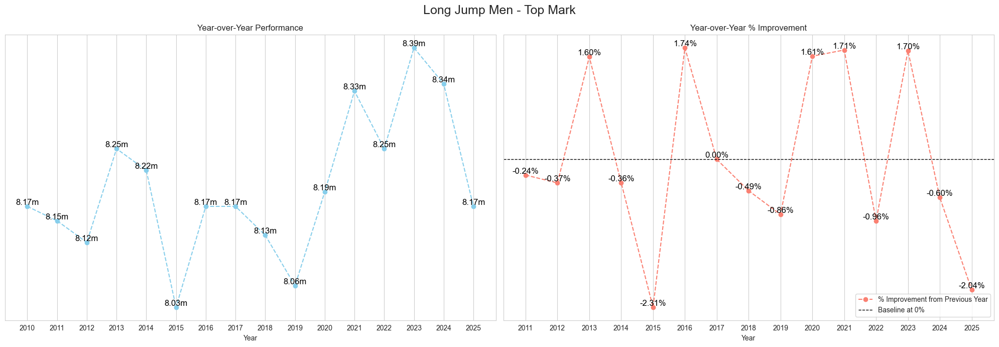

Long_Jump_Women


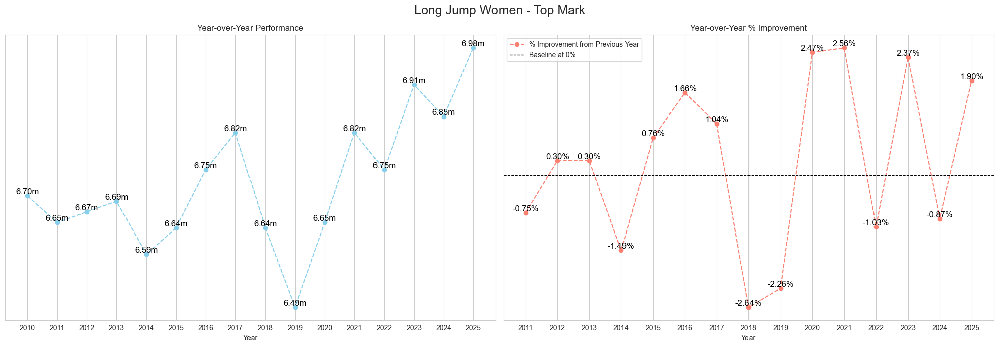

Triple_Jump_Men


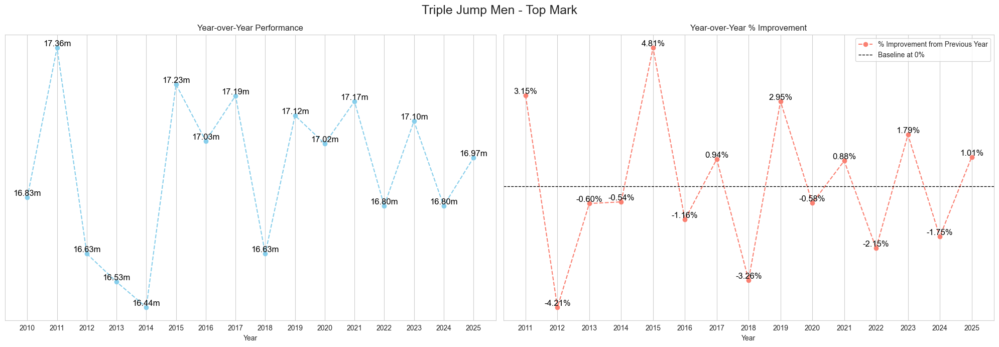

Triple_Jump_Women


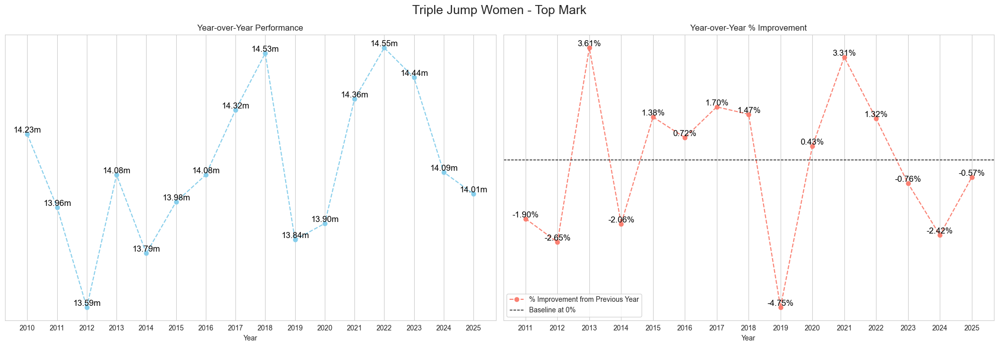

Shot_Put_Men


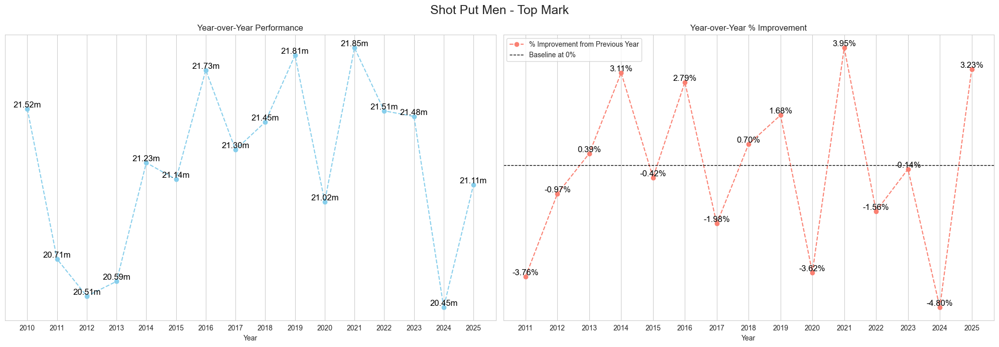

Shot_Put_Women


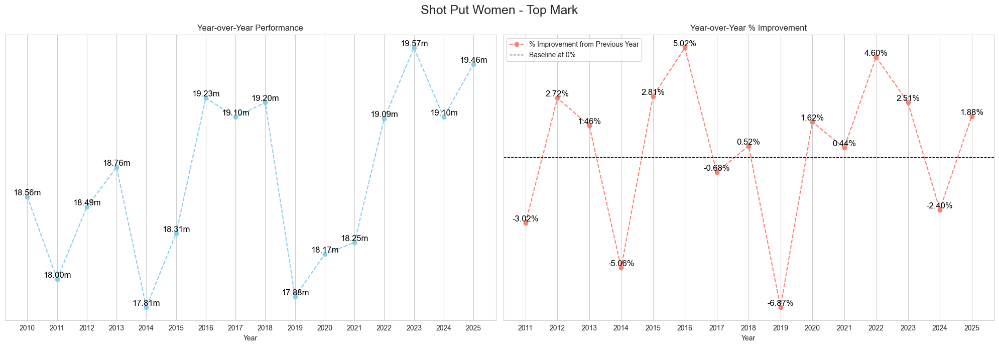

Weight_Throw_Men


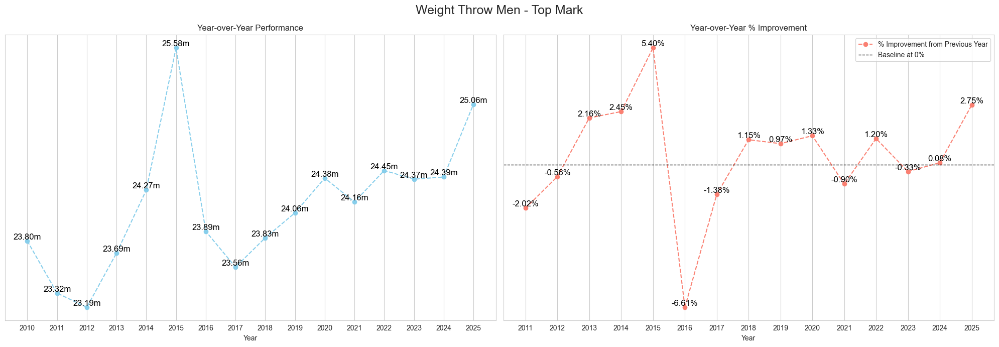

Weight_Throw_Women


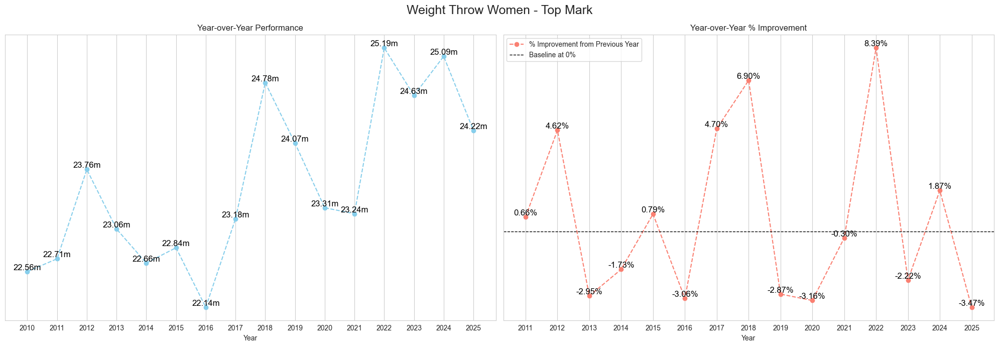

Pentathlon_Women


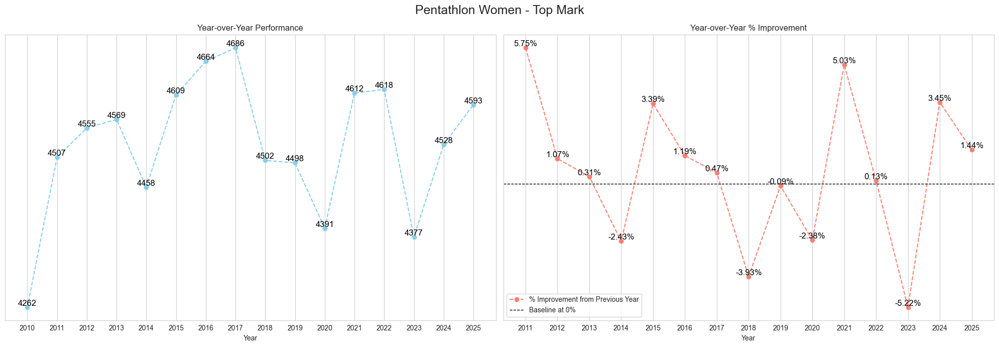

Heptathlon_Men


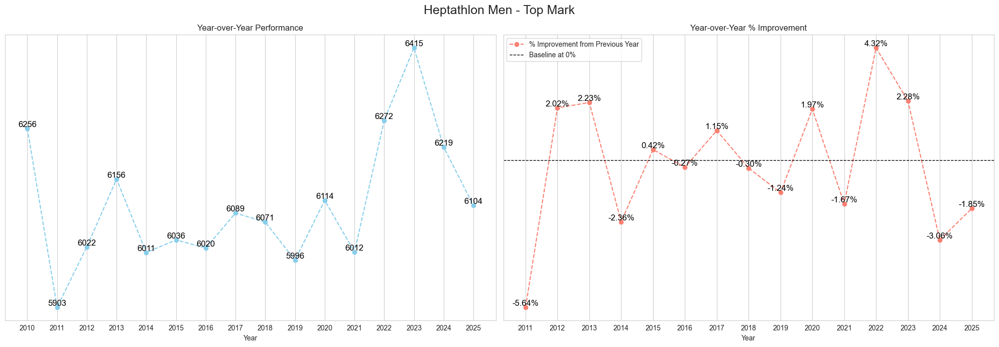

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style
sns.set_style("whitegrid")

df_1_clean = pd.DataFrame()

# Loop through each unique event
for event in df_1_place["event"].unique():
    print(event)

    # Filter data for the specific event
    event_df = df_1_place[df_1_place["event"] == event].copy()

    # Sort by year to ensure correct % change calculation
    event_df = event_df.sort_values(by="year").reset_index(drop=True)

    # Calculate % improvement (negative means better performance)
    event_df["pct_improvement"] = event_df["mark_new"].pct_change() * 100

    event_df["pct_improvement"] = event_df.apply(
        lambda row: row["pct_improvement"] * -1
        if (row["event_type"] == "running") | (row["event_type"] == "relay")
        else row["pct_improvement"],  # Leave mark unchanged for athlon events
        axis=1,
    )

    df_1_clean = pd.concat([df_1_clean, event_df])

    # Create subplots: (1) Bar chart for "mark_new" and (2) Line chart for % improvement
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))

    # # Bar chart (Performance Over Time)
    # sns.barplot(data=event_df, x="year", y="mark_new", ax=ax1, color="skyblue", width=0.6,
    #             order=sorted(event_df["year"].unique()))  # Ensures bars are spaced out

    ax1.plot(
        event_df["year"],
        event_df["mark_new"],
        marker="o",
        color="skyblue",
        linestyle="dashed",
        label="Year-over-year Performance",
    )

    # Label bars with mark values
    for i, (_, row) in enumerate(event_df.iterrows()):
        ax1.text(
            i,
            row["mark_new"],
            row["mark"],
            ha="center",
            va="bottom",
            fontsize=12,
            color="black",
        )

    # Bar chart formatting
    ax1.set_ylabel("")  # Remove y-axis labels
    ax1.set_xlabel("Year")
    ax1.set_title("Year-over-Year Performance")
    ax1.set_xticks(range(len(event_df["year"])))
    ax1.set_xticklabels(event_df["year"])
    ax1.set_yticks([])  # Remove y-axis ticks

    # Line chart (% Improvement)
    ax2.plot(
        event_df["year"],
        event_df["pct_improvement"],
        marker="o",
        color="salmon",
        linestyle="dashed",
        label="% Improvement from Previous Year",
    )

    # Label bars with percent_change values, but check if the value is finite
    for i, (_, row) in enumerate(event_df.iterrows()):
        if np.isfinite(row["pct_improvement"]):  # Check if the value is finite
            ax2.text(
                i,
                row["pct_improvement"],
                f"{row['pct_improvement']:.2f}%",
                ha="center",
                va="bottom",
                fontsize=12,
                color="black",
            )

    # Line chart formatting
    ax2.set_xlabel("Year")
    ax2.set_yticks([])  # Remove y-axis ticks
    ax2.set_title("Year-over-Year % Improvement")
    ax2.axhline(
        0, color="black", linestyle="--", linewidth=1, label="Baseline at 0%"
    )  # Baseline at 0%
    ax2.legend()

    plt.suptitle(f"{event.replace('_', ' ').title()} - Top Mark", fontsize=18)

    # Show plots
    plt.tight_layout()
    plt.show()

4_x_400_Relay_Men


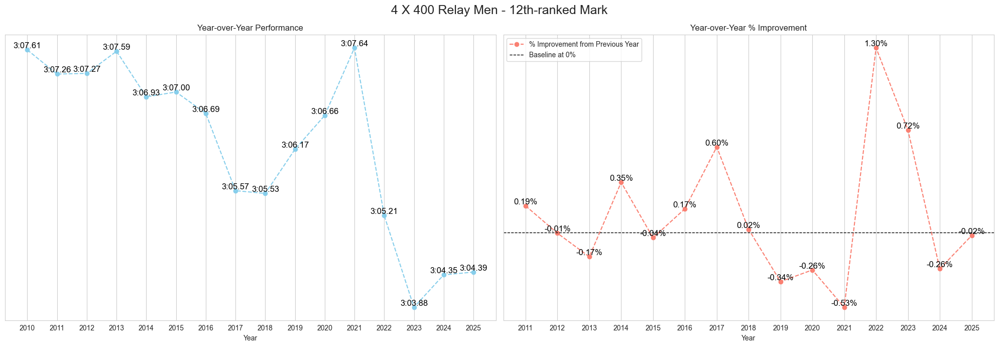

4_x_400_Relay_Women


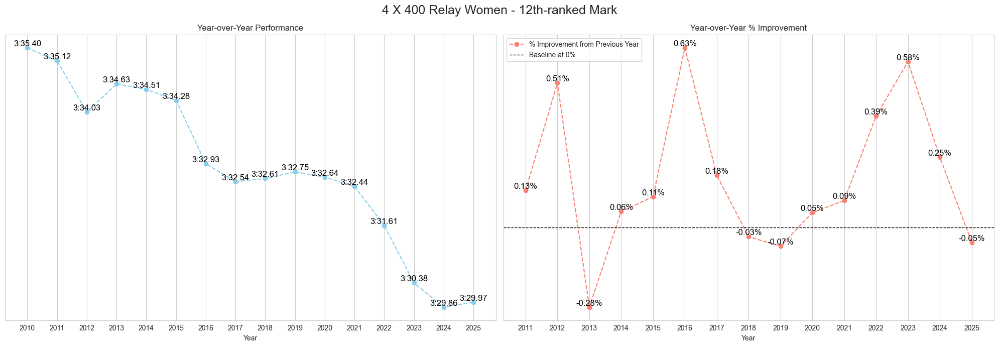

Distance_Medley_Relay_Men


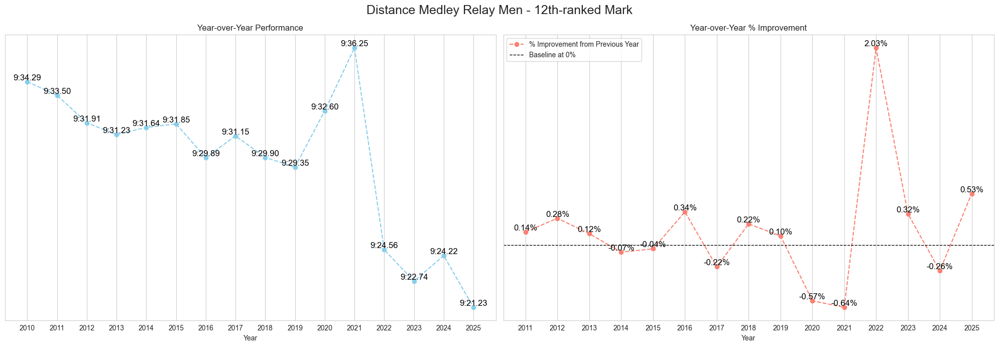

Distance_Medley_Relay_Women


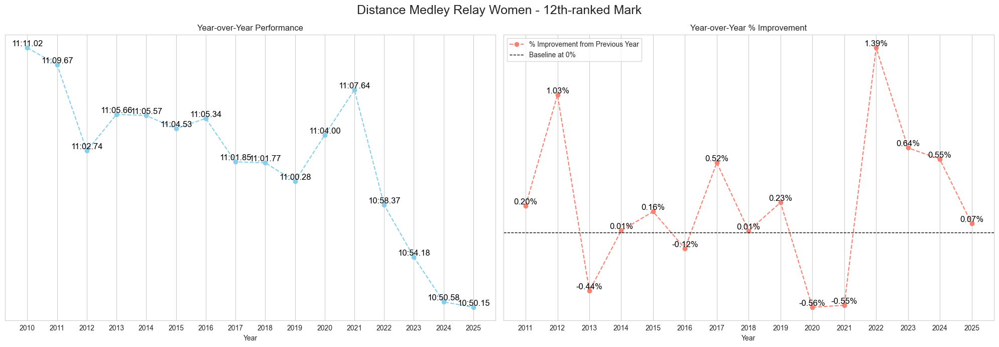

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style
sns.set_style("whitegrid")

df_12_clean = pd.DataFrame()

# Loop through each unique event
for event in df_12_place["event"].unique():
    print(event)

    # Filter data for the specific event
    event_df = df_12_place[df_12_place["event"] == event].copy()

    # Sort by year to ensure correct % change calculation
    event_df = event_df.sort_values(by="year").reset_index(drop=True)

    # Calculate % improvement (negative means better performance)
    event_df["pct_improvement"] = event_df["mark_new"].pct_change() * 100

    event_df["pct_improvement"] = event_df.apply(
        lambda row: row["pct_improvement"] * -1
        if (row["event_type"] == "running") | (row["event_type"] == "relay")
        else row["pct_improvement"],  # Leave mark unchanged for athlon events
        axis=1,
    )

    df_12_clean = pd.concat([df_12_clean, event_df])

    # Create subplots: (1) Bar chart for "mark_new" and (2) Line chart for % improvement
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))

    # # Bar chart (Performance Over Time)
    # sns.barplot(data=event_df, x="year", y="mark_new", ax=ax1, color="skyblue", width=0.6,
    #             order=sorted(event_df["year"].unique()))  # Ensures bars are spaced out

    ax1.plot(
        event_df["year"],
        event_df["mark_new"],
        marker="o",
        color="skyblue",
        linestyle="dashed",
        label="Year-over-year Performance",
    )

    # Label bars with mark values
    for i, (_, row) in enumerate(event_df.iterrows()):
        ax1.text(
            i,
            row["mark_new"],
            row["mark"],
            ha="center",
            va="bottom",
            fontsize=12,
            color="black",
        )

    # Bar chart formatting
    ax1.set_ylabel("")  # Remove y-axis labels
    ax1.set_xlabel("Year")
    ax1.set_title("Year-over-Year Performance")
    ax1.set_xticks(range(len(event_df["year"])))
    ax1.set_xticklabels(event_df["year"])
    ax1.set_yticks([])  # Remove y-axis ticks

    # Line chart (% Improvement)
    ax2.plot(
        event_df["year"],
        event_df["pct_improvement"],
        marker="o",
        color="salmon",
        linestyle="dashed",
        label="% Improvement from Previous Year",
    )

    import numpy as np

    # Label bars with percent_change values, but check if the value is finite
    for i, (_, row) in enumerate(event_df.iterrows()):
        if np.isfinite(row["pct_improvement"]):  # Check if the value is finite
            ax2.text(
                i,
                row["pct_improvement"],
                f"{row['pct_improvement']:.2f}%",
                ha="center",
                va="bottom",
                fontsize=12,
                color="black",
            )

    # Line chart formatting
    ax2.set_xlabel("Year")
    ax2.set_yticks([])  # Remove y-axis ticks
    ax2.set_title("Year-over-Year % Improvement")
    ax2.axhline(
        0, color="black", linestyle="--", linewidth=1, label="Baseline at 0%"
    )  # Baseline at 0%
    ax2.legend()

    plt.suptitle(f"{event.replace('_', ' ').title()} - 12th-ranked Mark", fontsize=18)

    # Show plots
    plt.tight_layout()
    plt.show()

In [459]:
df_1_clean.sort_values("pct_improvement", ascending=False).head()

,event,event_type,year,row_num,mark,mark_new,pct_improvement,improvement
12,Weight Throw Women,field,2022,1,25.19m,25.19,8.390706,1
8,Weight Throw Women,field,2018,1,24.78m,24.78,6.902502,1
15,Pole Vault Women,field,2025,1,4.91m,4.91,5.818966,1
1,Pentathlon Women,athlon,2011,1,4507,4507.00,5.748475,1
5,Weight Throw Men,field,2015,1,25.58m,25.58,5.397610,1


60_Meters_Men


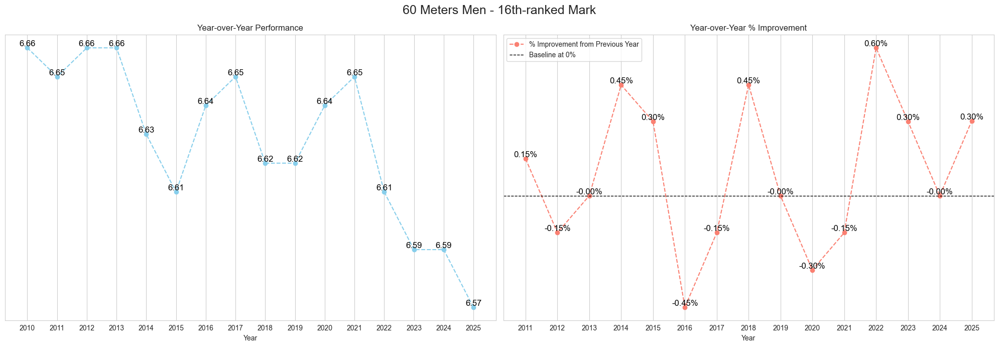

60_Meters_Women


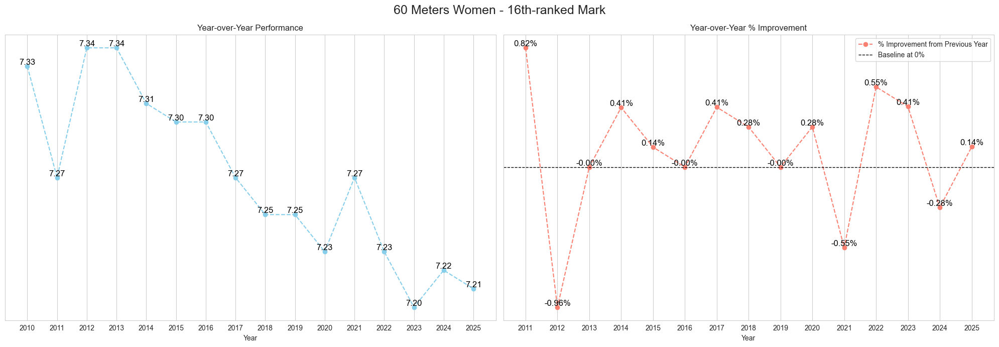

200_Meters_Men


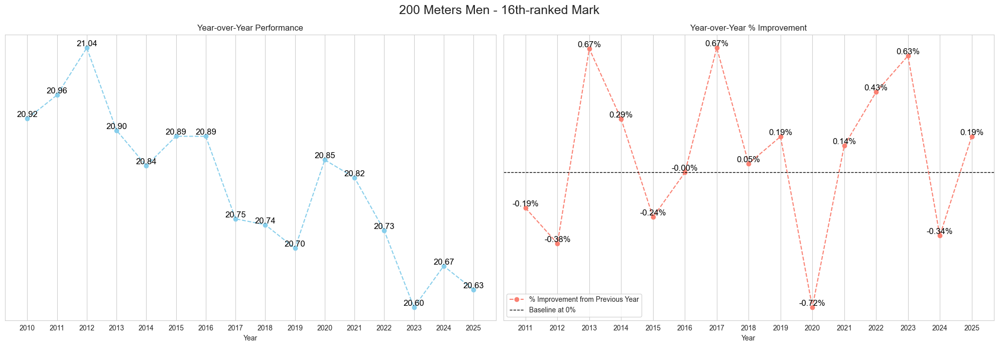

200_Meters_Women


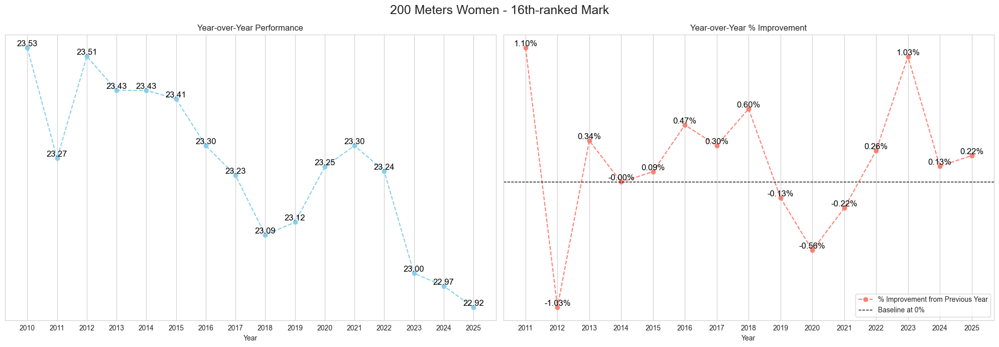

400_Meters_Men


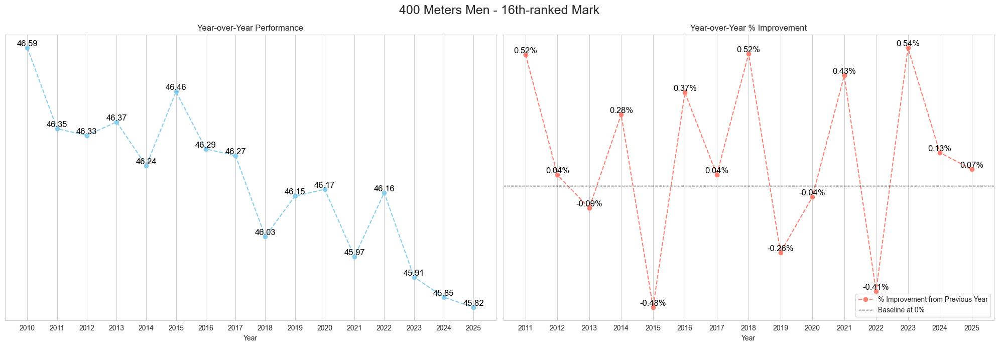

400_Meters_Women


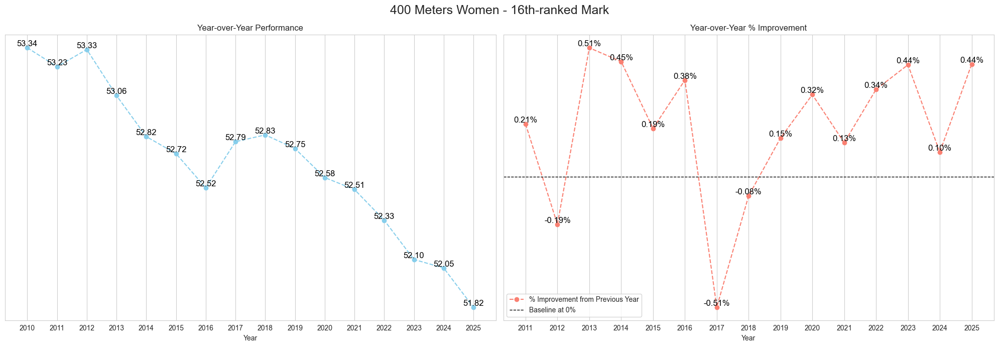

800_Meters_Men


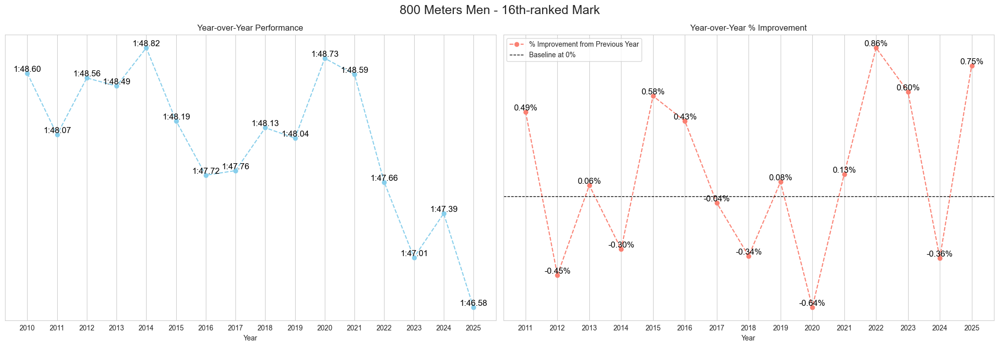

800_Meters_Women


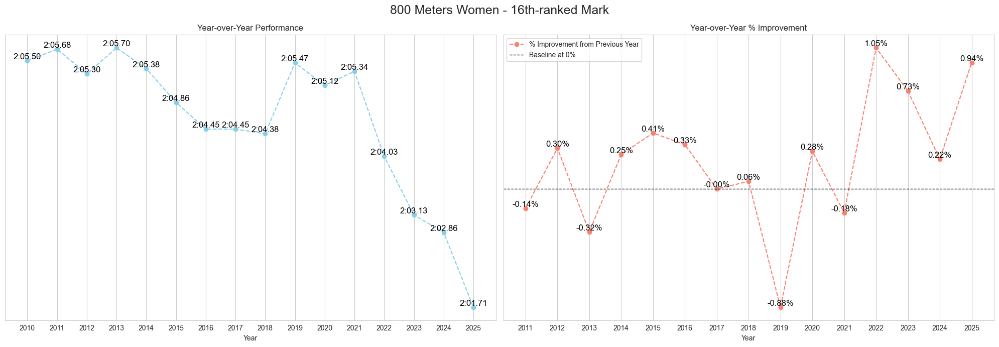

Mile_Men


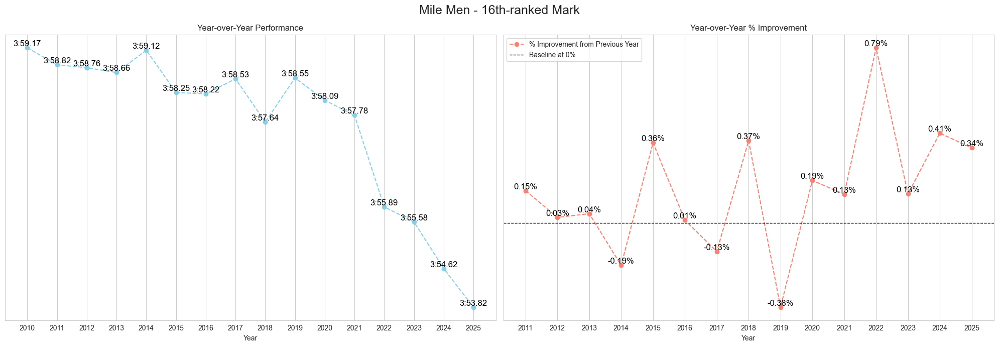

Mile_Women


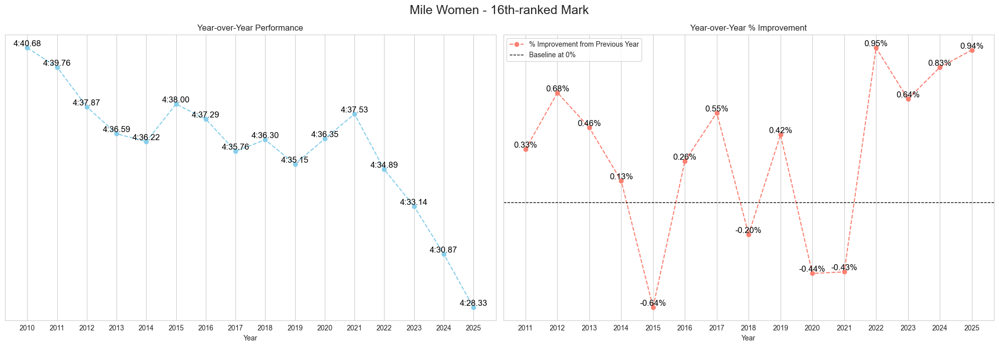

3000_Meters_Men


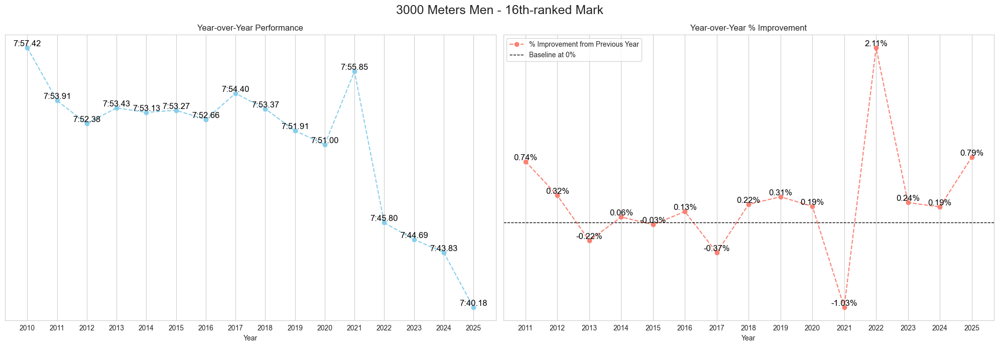

3000_Meters_Women


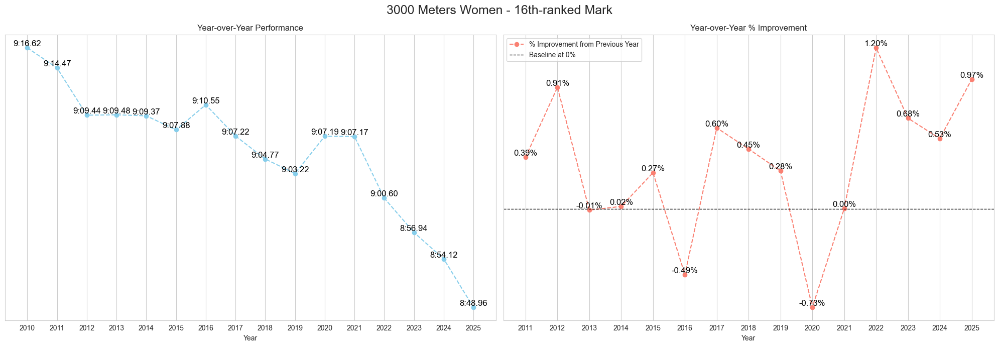

5000_Meters_Men


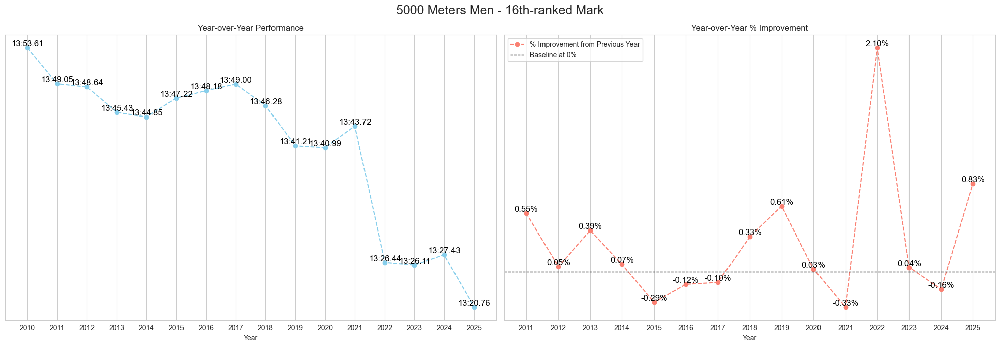

5000_Meters_Women


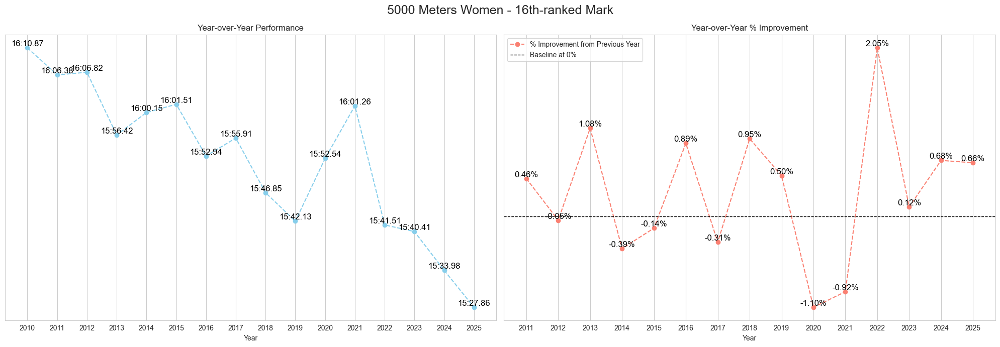

60_Hurdles_Men


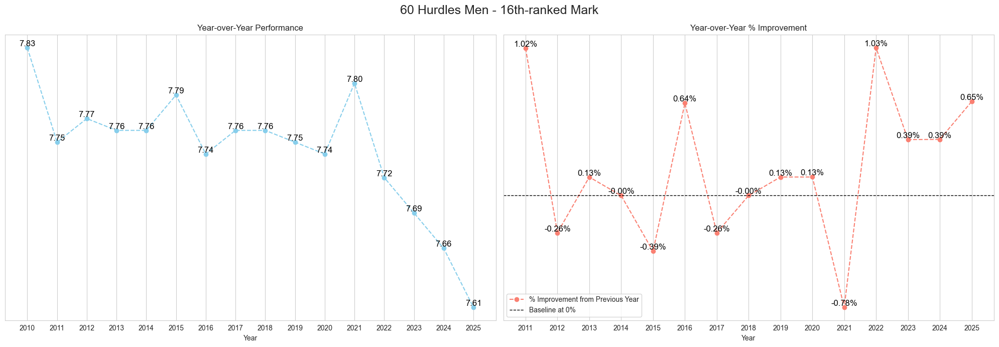

60_Hurdles_Women


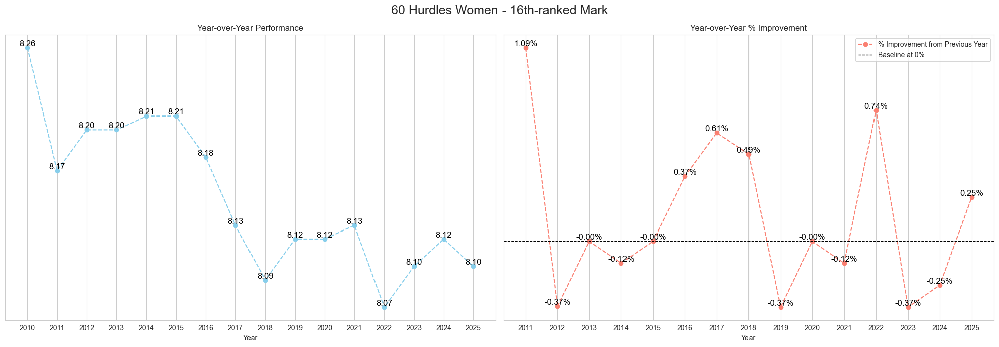

High_Jump_Men


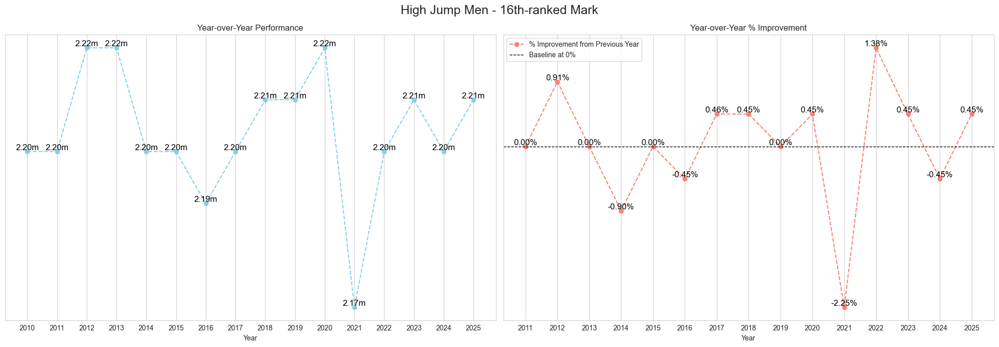

High_Jump_Women


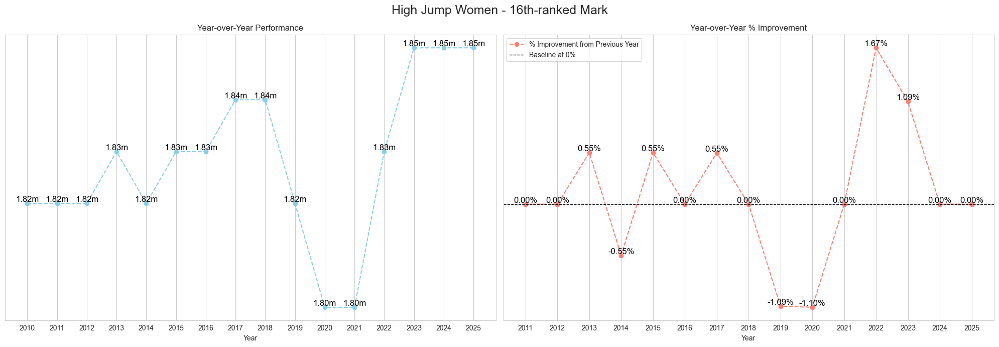

Pole_Vault_Men


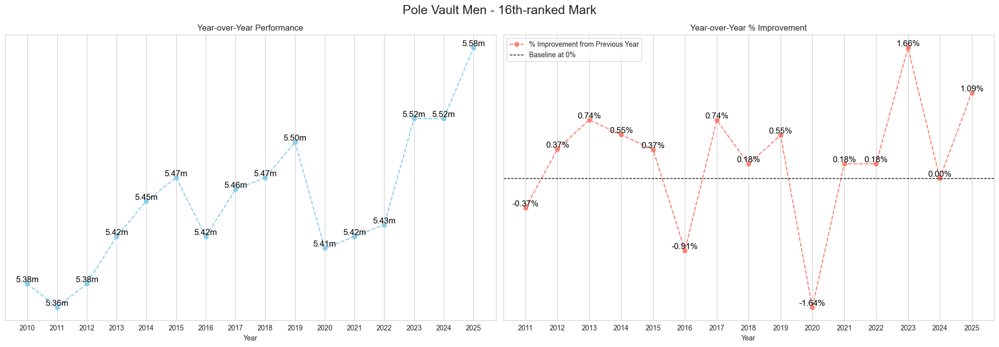

Pole_Vault_Women


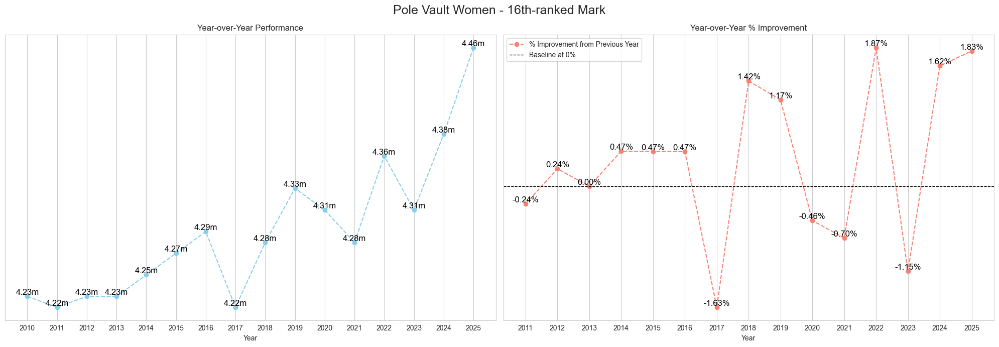

Long_Jump_Men


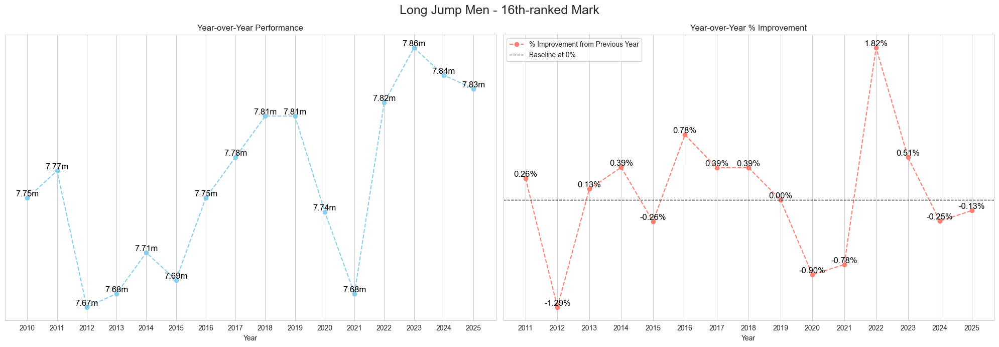

Long_Jump_Women


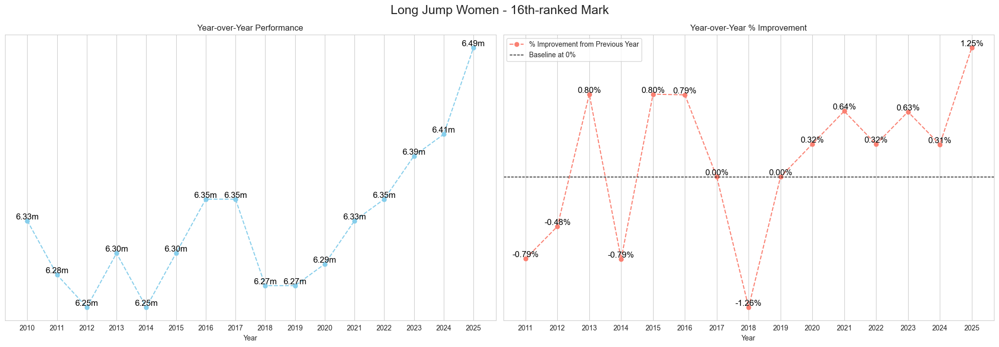

Triple_Jump_Men


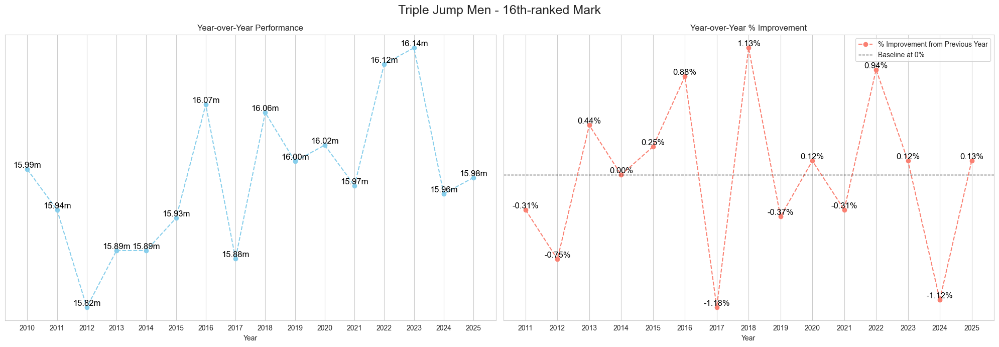

Triple_Jump_Women


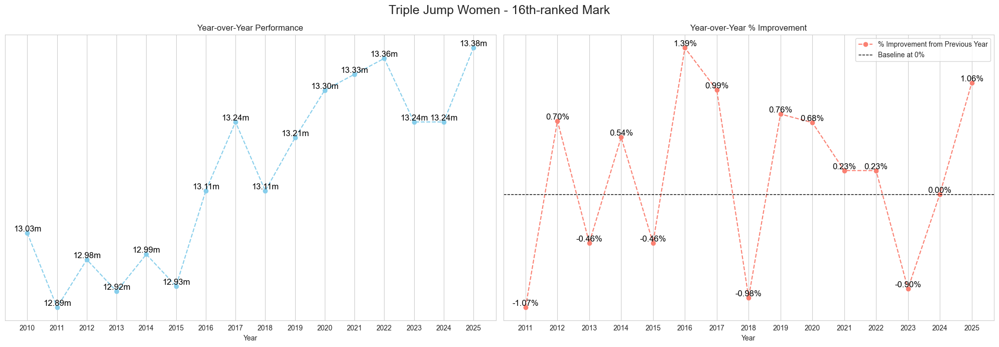

Shot_Put_Men


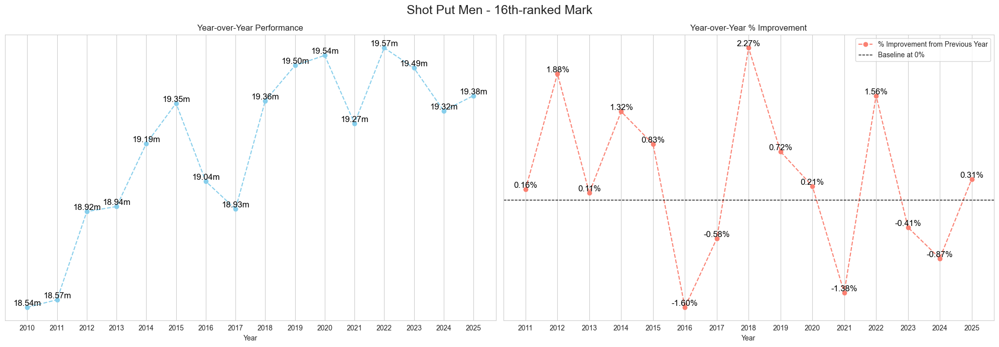

Shot_Put_Women


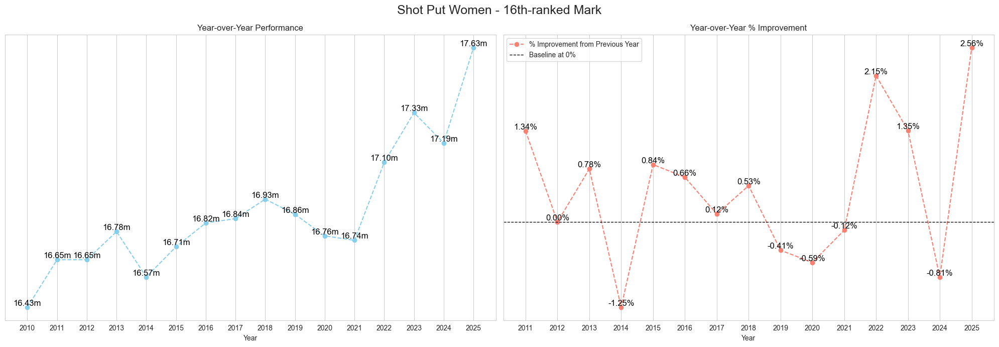

Weight_Throw_Men


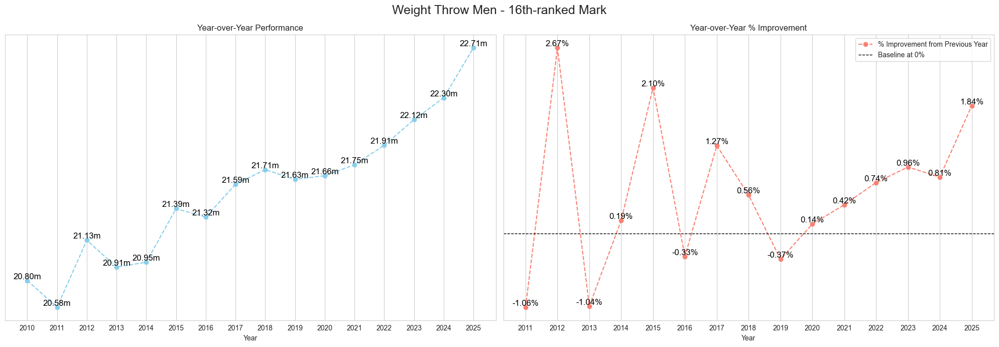

Weight_Throw_Women


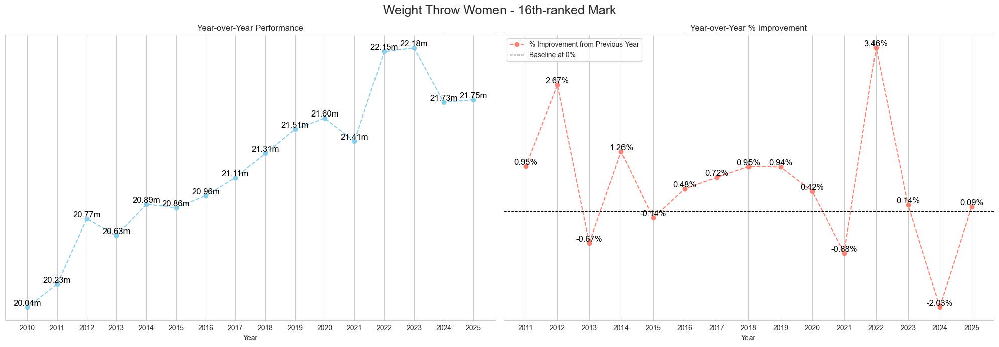

Pentathlon_Women


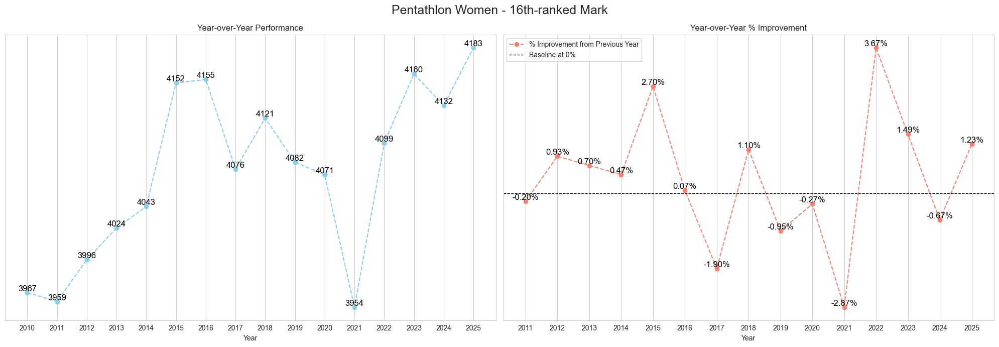

Heptathlon_Men


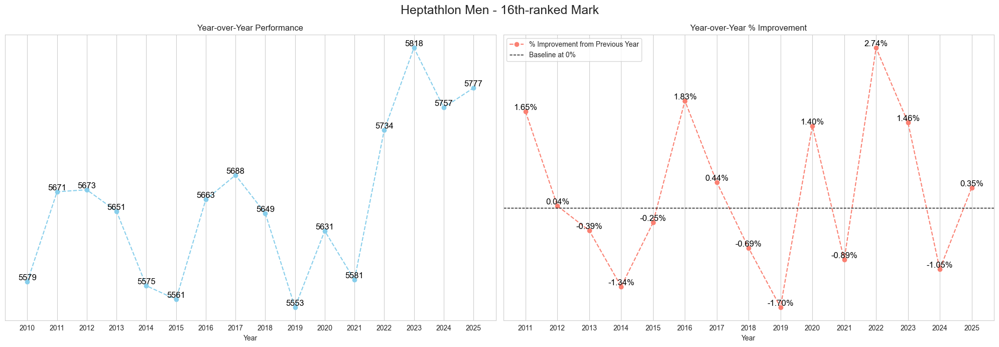

In [485]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style
sns.set_style("whitegrid")

df_16_clean = pd.DataFrame()

# Loop through each unique event
for event in df_16_place["event"].unique():
    print(event)

    # Filter data for the specific event
    event_df = df_16_place[df_16_place["event"] == event].copy()

    # Sort by year to ensure correct % change calculation
    event_df = event_df.sort_values(by="year").reset_index(drop=True)

    # Calculate % improvement (negative means better performance)
    event_df["pct_improvement"] = event_df["mark_new"].pct_change() * 100

    event_df["pct_improvement"] = event_df.apply(
        lambda row: row["pct_improvement"] * -1
        if (row["event_type"] == "running") | (row["event_type"] == "relay")
        else row["pct_improvement"],  # Leave mark unchanged for athlon events
        axis=1,
    )

    df_16_clean = pd.concat([df_16_clean, event_df])

    # Create subplots: (1) Bar chart for "mark_new" and (2) Line chart for % improvement
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))

    # # Bar chart (Performance Over Time)
    # sns.barplot(data=event_df, x="year", y="mark_new", ax=ax1, color="skyblue", width=0.6,
    #             order=sorted(event_df["year"].unique()))  # Ensures bars are spaced out

    ax1.plot(
        event_df["year"],
        event_df["mark_new"],
        marker="o",
        color="skyblue",
        linestyle="dashed",
        label="Year-over-year Performance",
    )

    # Label bars with mark values
    for i, (_, row) in enumerate(event_df.iterrows()):
        ax1.text(
            i,
            row["mark_new"],
            row["mark"],
            ha="center",
            va="bottom",
            fontsize=12,
            color="black",
        )

    # Bar chart formatting
    ax1.set_ylabel("")  # Remove y-axis labels
    ax1.set_xlabel("Year")
    ax1.set_title("Year-over-Year Performance")
    ax1.set_xticks(range(len(event_df["year"])))
    ax1.set_xticklabels(event_df["year"])
    ax1.set_yticks([])  # Remove y-axis ticks

    # Line chart (% Improvement)
    ax2.plot(
        event_df["year"],
        event_df["pct_improvement"],
        marker="o",
        color="salmon",
        linestyle="dashed",
        label="% Improvement from Previous Year",
    )

    import numpy as np

    # Label bars with percent_change values, but check if the value is finite
    for i, (_, row) in enumerate(event_df.iterrows()):
        if np.isfinite(row["pct_improvement"]):  # Check if the value is finite
            ax2.text(
                i,
                row["pct_improvement"],
                f"{row['pct_improvement']:.2f}%",
                ha="center",
                va="bottom",
                fontsize=12,
                color="black",
            )

    # Line chart formatting
    ax2.set_xlabel("Year")
    ax2.set_yticks([])  # Remove y-axis ticks
    ax2.set_title("Year-over-Year % Improvement")
    ax2.axhline(
        0, color="black", linestyle="--", linewidth=1, label="Baseline at 0%"
    )  # Baseline at 0%
    ax2.legend()

    plt.suptitle(f"{event.replace('_', ' ').title()} - 16th-ranked Mark", fontsize=18)

    # Show plots
    plt.tight_layout()
    plt.show()

Consecutive Improvements

In [ ]:
# Function to count consecutive improvements
def count_consecutive_improvements(group):
    group["consecutive_improvements"] = (
        group["improvement"] != group["improvement"].shift()
    ).cumsum()
    group["consecutive_improvements"] = group.groupby("consecutive_improvements")[
        "improvement"
    ].transform("sum")
    return group


df_1_clean["improvement"] = np.where(df_1_clean["pct_improvement"] > 0, 1, 0)

# Apply the function to each event
df_1_improvement = df_1_clean.groupby("event").apply(count_consecutive_improvements)

# Display the DataFrame with the consecutive improvements
df_1_improvement[df_1_improvement["year"] == "2025"][
    ["event", "year", "consecutive_improvements"]
].sort_values(["consecutive_improvements", "year"], ascending=False).head()

/var/folders/hw/k51wqqw93751fx50t4_d520c0000gn/T/ipykernel_23288/1598074706.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_1_improvement = df_1_clean.groupby('event').apply(count_consecutive_improvements)


,,event,year,consecutive_improvements
event,,,,
Distance_Medley_Relay_Women,15,Distance_Medley_Relay_Women,2025,7
Mile_Men,15,Mile_Men,2025,3
5000_Meters_Women,15,5000_Meters_Women,2025,2
800_Meters_Men,15,800_Meters_Men,2025,2
Pentathlon_Women,15,Pentathlon_Women,2025,2


In [340]:
df_16_clean["improvement"] = np.where(df_16_clean["pct_improvement"] > 0, 1, 0)

# Apply the function to each event
df_16_improvement = df_16_clean.groupby("event").apply(count_consecutive_improvements)

# Display the DataFrame with the consecutive improvements
df_16_improvement[df_16_improvement["year"] == "2025"][
    ["event", "year", "consecutive_improvements"]
].sort_values(["consecutive_improvements", "year"], ascending=False).head(10)

/var/folders/hw/k51wqqw93751fx50t4_d520c0000gn/T/ipykernel_23288/3628727913.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_16_improvement = df_16_clean.groupby('event').apply(count_consecutive_improvements)


,,event,year,consecutive_improvements
event,,,,
400_Meters_Women,15,400_Meters_Women,2025,7
Long_Jump_Women,15,Long_Jump_Women,2025,6
Mile_Men,15,Mile_Men,2025,6
Weight_Throw_Men,15,Weight_Throw_Men,2025,6
3000_Meters_Women,15,3000_Meters_Women,2025,5
200_Meters_Women,15,200_Meters_Women,2025,4
3000_Meters_Men,15,3000_Meters_Men,2025,4
5000_Meters_Women,15,5000_Meters_Women,2025,4
60_Hurdles_Men,15,60_Hurdles_Men,2025,4


In [341]:
df_12_clean["improvement"] = np.where(df_12_clean["pct_improvement"] > 0, 1, 0)

# Apply the function to each event
df_12_improvement = df_12_clean.groupby("event").apply(count_consecutive_improvements)

# Display the DataFrame with the consecutive improvements
df_12_improvement[df_12_improvement["year"] == "2025"][
    ["event", "year", "consecutive_improvements"]
].sort_values(["consecutive_improvements", "year"], ascending=False)

/var/folders/hw/k51wqqw93751fx50t4_d520c0000gn/T/ipykernel_23288/2678100119.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_12_improvement = df_12_clean.groupby('event').apply(count_consecutive_improvements)


,,event,year,consecutive_improvements
event,,,,
Distance_Medley_Relay_Women,15,Distance_Medley_Relay_Women,2025,4
Distance_Medley_Relay_Men,15,Distance_Medley_Relay_Men,2025,1
4_x_400_Relay_Men,15,4_x_400_Relay_Men,2025,0
4_x_400_Relay_Women,15,4_x_400_Relay_Women,2025,0


Number of improvements overall

In [350]:
df_1_clean.reset_index().groupby("event").aggregate({"improvement": "sum"}).sort_values(
    "improvement", ascending=False
).head(10)

,improvement
event,
Distance_Medley_Relay_Women,12
Distance_Medley_Relay_Men,10
Shot_Put_Women,10
Pole_Vault_Women,10
Pentathlon_Women,10
Mile_Men,10
200_Meters_Men,10
5000_Meters_Women,9
Weight_Throw_Men,9


In [351]:
df_12_clean.reset_index().groupby("event").aggregate(
    {"improvement": "sum"}
).sort_values("improvement", ascending=False).head(10)

,improvement
event,
4_x_400_Relay_Women,11
Distance_Medley_Relay_Women,11
Distance_Medley_Relay_Men,9
4_x_400_Relay_Men,7


In [354]:
df_16_clean.reset_index().groupby("event").aggregate(
    {"improvement": "sum"}
).sort_values("improvement", ascending=False)

,improvement
event,
Mile_Men,12
3000_Meters_Women,12
400_Meters_Women,12
Weight_Throw_Men,11
Mile_Women,11
Pole_Vault_Men,11
Weight_Throw_Women,11
3000_Meters_Men,11
5000_Meters_Men,10


In [ ]:
df_12_clean.groupby("year").aggregate({"pct_improvement": ["min", "max"]})

pct_improvement          
                 min       max
year                          
2010             NaN       NaN
2011        0.129991  0.201186
2012       -0.005340  1.034838
2013       -0.440595  0.118900
2014       -0.071775  0.351831
2015       -0.037447  0.156257
2016       -0.121891  0.630017
2017       -0.221095  0.599925
2018       -0.032935  0.218857
2019       -0.344958  0.225154
2020       -0.570826  0.051704
2021       -0.637443  0.094056
2022        0.390699  2.028633
2023        0.322375  0.718104
2024       -0.262999  0.550307
2025       -0.052416  0.529935

In [266]:
df_16_clean.groupby("year").aggregate({"pct_improvement": ["min", "max"]})

pct_improvement          
                 min       max
year                          
2010             NaN       NaN
2011       -1.074444  1.649041
2012       -1.287001  2.672498
2013       -1.041174  1.075691
2014       -1.344895  1.319958
2015       -0.644414  2.696018
2016       -1.602067  1.834202
2017       -1.901324  1.266417
2018       -1.259843  2.271527
2019       -1.699416  1.168224
2020       -1.636364  1.404646
2021       -2.873987  0.635930
2022       -0.413313  3.667172
2023       -1.146789  1.657459
2024       -2.028855  1.624130
2025       -0.127551  2.559628

In [473]:
df_1_clean.groupby("event").aggregate({"pct_improvement": "max"}).merge(
    df_1_clean, how="inner", on="pct_improvement"
).groupby("year").count().sort_values("pct_improvement", ascending=False)

,pct_improvement,event,event_type,row_num,mark,mark_new
year,,,,,,
2021,7,7,7,7,7,7
2022,5,5,5,5,5,5
2015,4,4,4,4,4,4
2012,3,3,3,3,3,3
2013,3,3,3,3,3,3
2016,3,3,3,3,3,3
2023,3,3,3,3,3,3
2025,3,3,3,3,3,3
2011,2,2,2,2,2,2


In [474]:
df_16_clean.groupby("event").aggregate({"pct_improvement": "max"}).merge(
    df_16_clean, how="inner", on="pct_improvement"
).groupby("year").count().sort_values("pct_improvement", ascending=False)

,pct_improvement,event,event_type,row_num,mark,mark_new
year,,,,,,
2022,17,17,17,17,17,17
2011,3,3,3,3,3,3
2018,2,2,2,2,2,2
2023,2,2,2,2,2,2
2025,2,2,2,2,2,2
2012,1,1,1,1,1,1
2013,1,1,1,1,1,1
2016,1,1,1,1,1,1
2017,1,1,1,1,1,1


In [371]:
df_1_2025 = df_1_clean[df_1_clean["year"] == "2025"][
    ["event", "pct_improvement"]
].sort_values("pct_improvement", ascending=False)
df_16_2025 = df_16_clean[df_16_clean["year"] == "2025"][
    ["event", "pct_improvement"]
].sort_values("pct_improvement", ascending=False)
df_12_2025 = df_12_clean[df_12_clean["year"] == "2025"][
    ["event", "pct_improvement"]
].sort_values("pct_improvement", ascending=False)

In [372]:
df_12_2025.head(10)

,event,pct_improvement
15,Distance_Medley_Relay_Men,0.529935
15,Distance_Medley_Relay_Women,0.066095
15,4_x_400_Relay_Men,-0.021698
15,4_x_400_Relay_Women,-0.052416


In [381]:
df_16_2025.tail()

,event,pct_improvement
15,Triple Jump Men,0.125313
15,Weight Throw Women,0.092039
15,400 Meters Men,0.065431
15,High Jump Women,0.000000
15,Long Jump Men,-0.127551


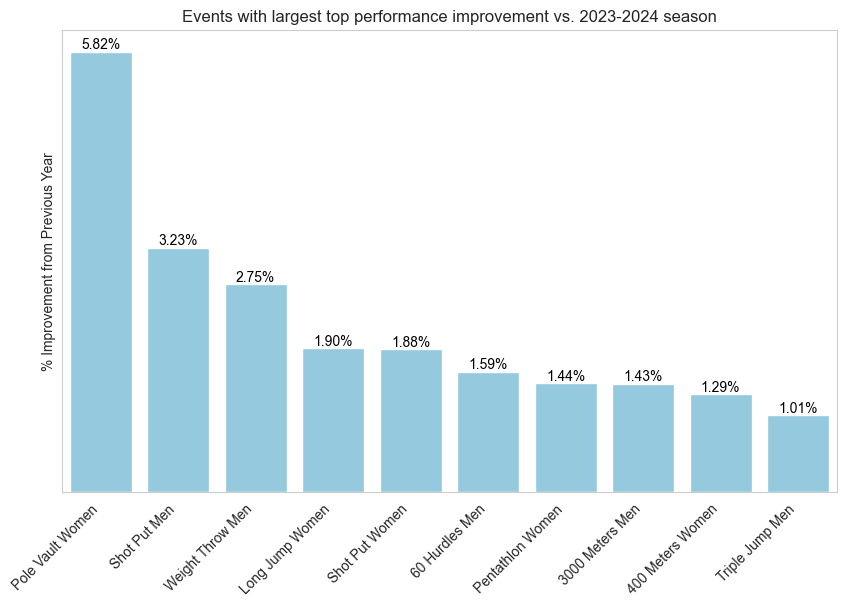

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Replace underscores with spaces in the 'event' column
df_1_2025["event"] = df_1_2025["event"].str.replace("_", " ")

# Set figure size
plt.figure(figsize=(10, 6))

# Create bar plot
ax = sns.barplot(
    data=df_1_2025.head(10), x="event", y="pct_improvement", color="skyblue"
)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha="right")

# Add data labels formatted as percentages
for p in ax.patches:
    ax.annotate(
        f"{p.get_height():.2f}%",
        (p.get_x() + p.get_width() / 2.0, p.get_height()),
        ha="center",
        va="bottom",
        fontsize=10,
        color="black",
    )

# Remove y-axis ticks and label
ax.set_yticks([])
ax.set_xlabel("")
ax.set_ylabel("% Improvement from Previous Year")

# Add title
plt.title("Events with largest top performance improvement vs. 2023-2024 season")

# Show plot
plt.show()


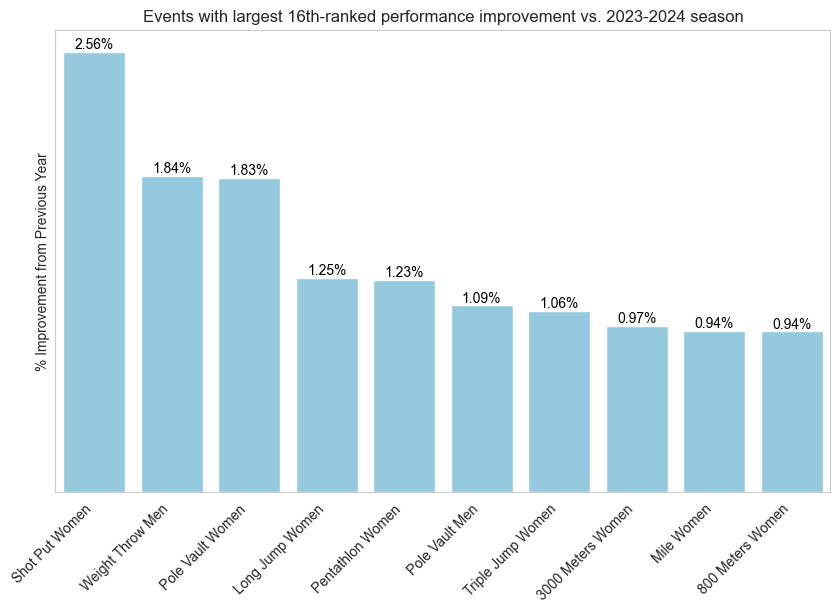

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Replace underscores with spaces in the 'event' column
df_16_2025["event"] = df_16_2025["event"].str.replace("_", " ")

# Set figure size
plt.figure(figsize=(10, 6))

# Create bar plot
ax = sns.barplot(
    data=df_16_2025.head(10), x="event", y="pct_improvement", color="skyblue"
)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha="right")

# Add data labels formatted as percentages
for p in ax.patches:
    ax.annotate(
        f"{p.get_height():.2f}%",
        (p.get_x() + p.get_width() / 2.0, p.get_height()),
        ha="center",
        va="bottom",
        fontsize=10,
        color="black",
    )

# Remove y-axis ticks and label
ax.set_yticks([])
ax.set_ylabel("% Improvement from Previous Year")

# Remove x-axis title
ax.set_xlabel("")

# Add title
plt.title(
    "Events with largest 16th-ranked performance improvement vs. 2023-2024 season"
)

# Show plot
plt.show()

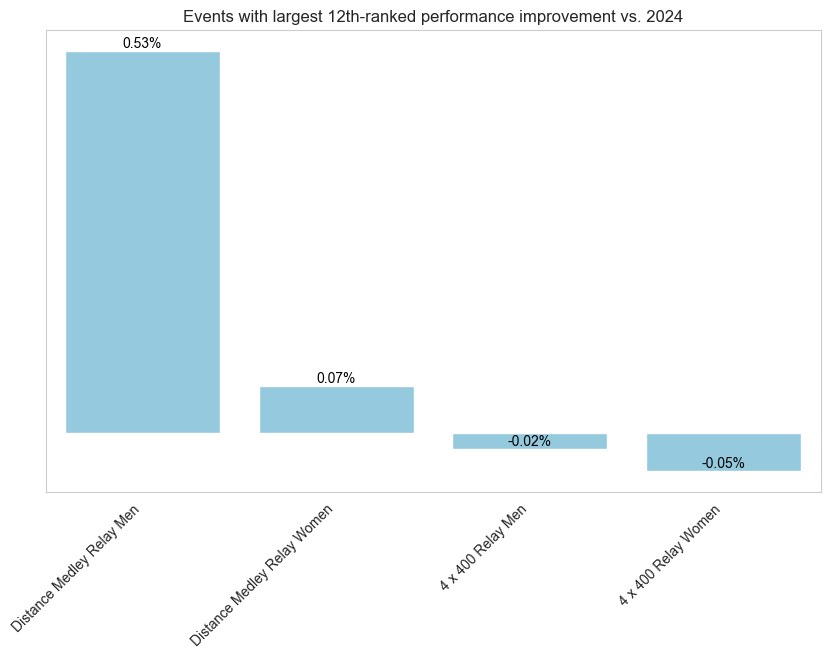

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Replace underscores with spaces in the 'event' column
df_12_2025["event"] = df_12_2025["event"].str.replace("_", " ")

# Set figure size
plt.figure(figsize=(10, 6))

# Create bar plot
ax = sns.barplot(data=df_12_2025, x="event", y="pct_improvement", color="skyblue")

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha="right")

# Add data labels formatted as percentages
for p in ax.patches:
    ax.annotate(
        f"{p.get_height():.2f}%",
        (p.get_x() + p.get_width() / 2.0, p.get_height()),
        ha="center",
        va="bottom",
        fontsize=10,
        color="black",
    )

# Remove y-axis ticks and label
ax.set_yticks([])
ax.set_ylabel("")

# Remove x-axis title
ax.set_xlabel("")

# Add title
plt.title("Events with largest 12th-ranked performance improvement vs. 2024")

# Show plot
plt.show()

In [384]:
len(df_1_clean["event"].unique())

34

In [401]:
df_1_by_year = (
    df_1_clean[df_1_clean["year"] != "2010"]
    .groupby("year")
    .aggregate({"improvement": "sum"})
    .sort_values("improvement", ascending=False)
)
df_1_by_year.head()

,improvement
year,
2013,23
2022,23
2023,21
2016,20
2020,20


In [ ]:
df_16_by_year = (
    pd.concat(
        [
            df_16_clean[df_16_clean["year"] != "2010"][["year", "improvement"]],
            df_12_clean[df_12_clean["year"] != "2010"][["year", "improvement"]],
        ]
    )
    .groupby("year")
    .aggregate({"improvement": "sum"})
    .sort_values("improvement", ascending=False)
)
df_16_by_year.head()

,improvement
year,
2022,33
2023,30
2025,30
2018,25
2011,23


In [ ]:
df_by_year = (
    df_1_by_year.reset_index()
    .merge(df_16_by_year.reset_index(), how="inner", on="year", suffixes=["_1", "_16"])
    .sort_values("year")
)

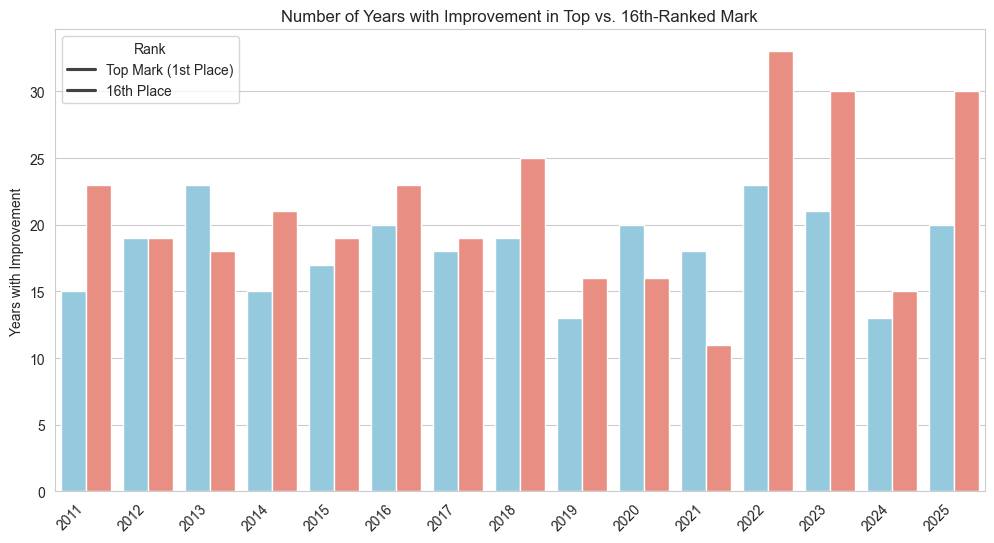

In [404]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set figure size
plt.figure(figsize=(12, 6))

# Create bar plot with two bars per year
ax = sns.barplot(
    data=df_by_year.melt(
        id_vars="year", var_name="Rank", value_name="Improvement_Count"
    ),
    x="year",
    y="Improvement_Count",
    hue="Rank",
    palette=["skyblue", "salmon"],
)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha="right")

# Add labels and title
plt.xlabel("")
plt.ylabel("Years with Improvement")
plt.title("Number of Years with Improvement in Top vs. 16th-Ranked Mark")

# Show plot
plt.legend(title="Rank", labels=["Top Mark (1st Place)", "16th Place"])
plt.show()


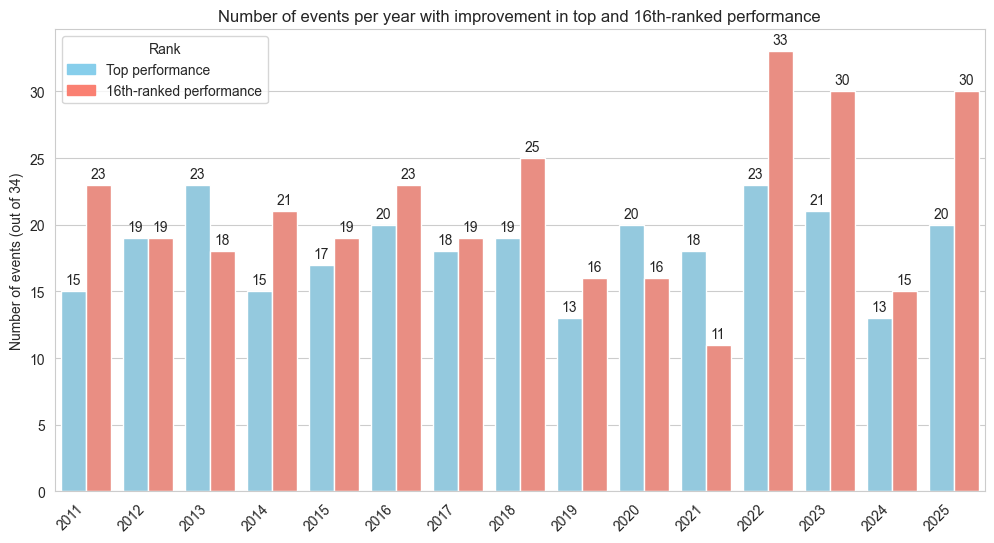

In [409]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch

# Set figure size
plt.figure(figsize=(12, 6))

# Melt the dataframe for plotting
df_melted = df_by_year.melt(
    id_vars="year", var_name="Rank", value_name="Improvement_Count"
)

# Define colors
colors = ["skyblue", "salmon"]

# Create bar plot
ax = sns.barplot(
    data=df_melted, x="year", y="Improvement_Count", hue="Rank", palette=colors
)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha="right")

# Add labels and title
plt.xlabel("")
plt.ylabel("Number of events (out of 34)")
plt.title(
    "Number of events per year with improvement in top and 16th-ranked performance"
)

for bars in ax.containers:
    ax.bar_label(
        bars, fmt="%.0f", fontsize=10, padding=3
    )  # Format as integer, add padding

# Customize legend to match the bar colors

legend_labels = ["Top performance", "16th-ranked performance"]
legend_handles = [Patch(color=colors[i], label=legend_labels[i]) for i in range(2)]
plt.legend(handles=legend_handles, title="Rank")

# Show plot
plt.show()


In [393]:
df_16_clean[(df_16_clean["year"] == "2022") & (df_16_clean["improvement"] == 0)]

,event,event_type,year,row_num,mark,mark_new,pct_improvement,improvement
12,400_Meters_Men,running,2022,16,46.16,46.16,-0.413313,0


In [412]:
df_1_clean[df_1_clean["year"] == "2010"][["event", "mark", "mark_new"]]

,event,event_type,year,row_num,mark,mark_new,pct_improvement,improvement
0,60 Meters Men,running,2010,1,6.59,6.59,NaN,0
0,60 Meters Women,running,2010,1,7.18,7.18,NaN,0
0,200 Meters Men,running,2010,1,20.67,20.67,NaN,0
0,200 Meters Women,running,2010,1,22.98,22.98,NaN,0
0,400 Meters Men,running,2010,1,45.03,45.03,NaN,0
0,400 Meters Women,running,2010,1,51.15,51.15,NaN,0
0,800 Meters Men,running,2010,1,1:46.36,106.36,NaN,0
0,800 Meters Women,running,2010,1,2:01.47,121.47,NaN,0
0,Mile Men,running,2010,1,3:57.62,237.62,NaN,0
0,Mile Women,running,2010,1,4:31.24,271.24,NaN,0


60_Meters_Men
60_Meters_Women
200_Meters_Men
200_Meters_Women
400_Meters_Men
400_Meters_Women
800_Meters_Men
800_Meters_Women
Mile_Men
Mile_Women
3000_Meters_Men
3000_Meters_Women
5000_Meters_Men
5000_Meters_Women
60_Hurdles_Men
60_Hurdles_Women
4_x_400_Relay_Men
4_x_400_Relay_Women
Distance_Medley_Relay_Men
Distance_Medley_Relay_Women
High_Jump_Men


/var/folders/hw/k51wqqw93751fx50t4_d520c0000gn/T/ipykernel_23288/2480538662.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7), gridspec_kw={'width_ratios': [1.5, 1]})


High_Jump_Women
Pole_Vault_Men
Pole_Vault_Women
Long_Jump_Men
Long_Jump_Women
Triple_Jump_Men
Triple_Jump_Women
Shot_Put_Men
Shot_Put_Women
Weight_Throw_Men
Weight_Throw_Women
Pentathlon_Women
Heptathlon_Men


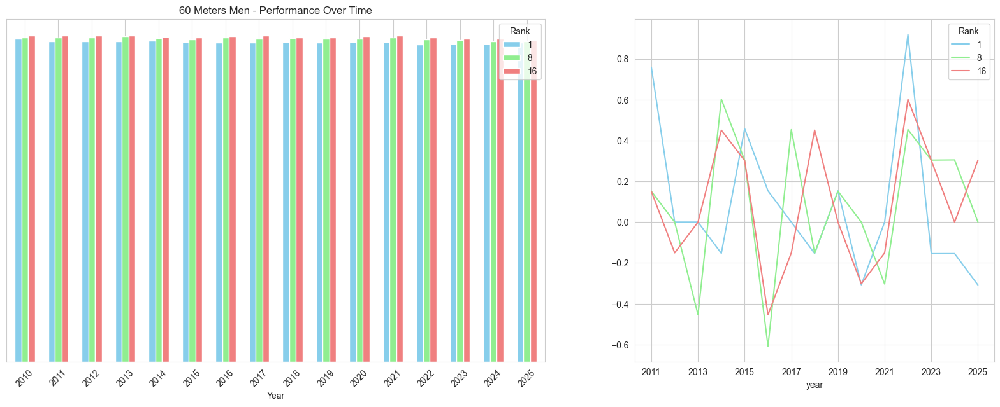

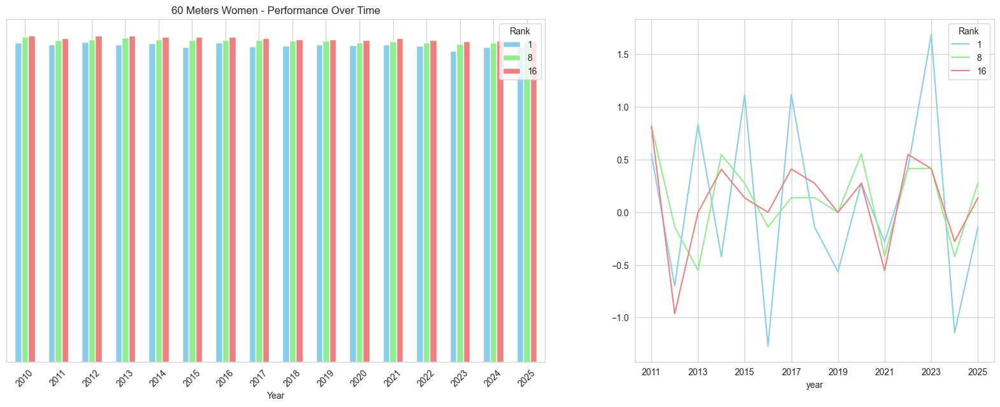

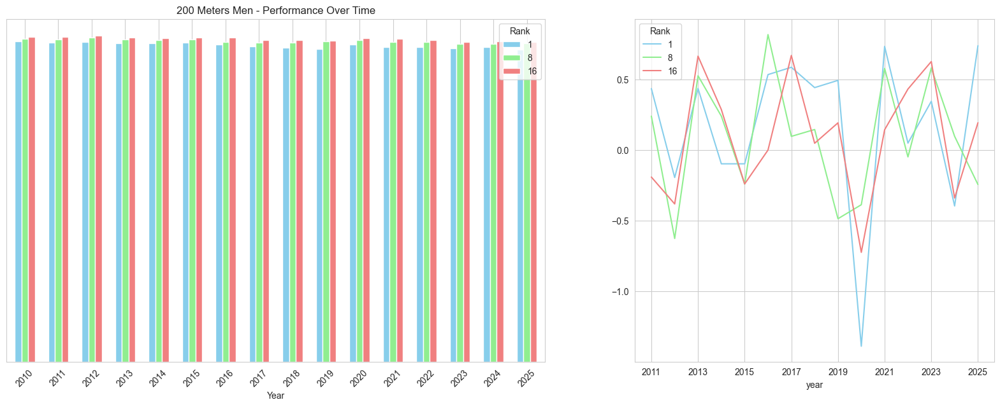

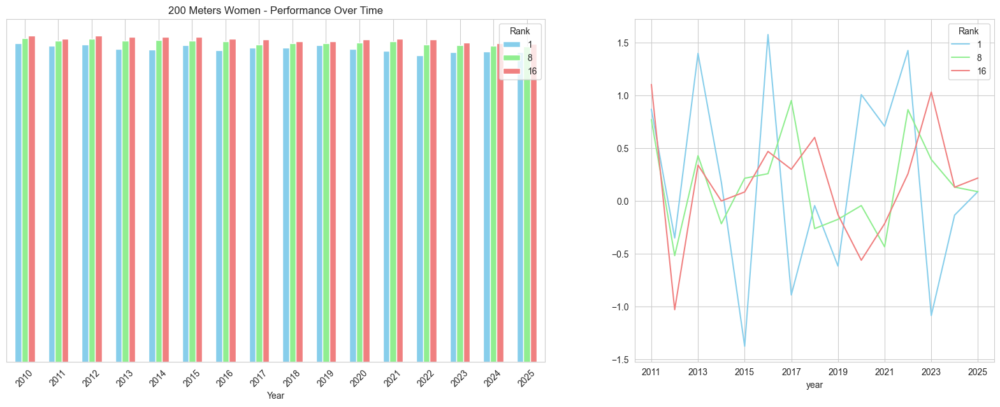

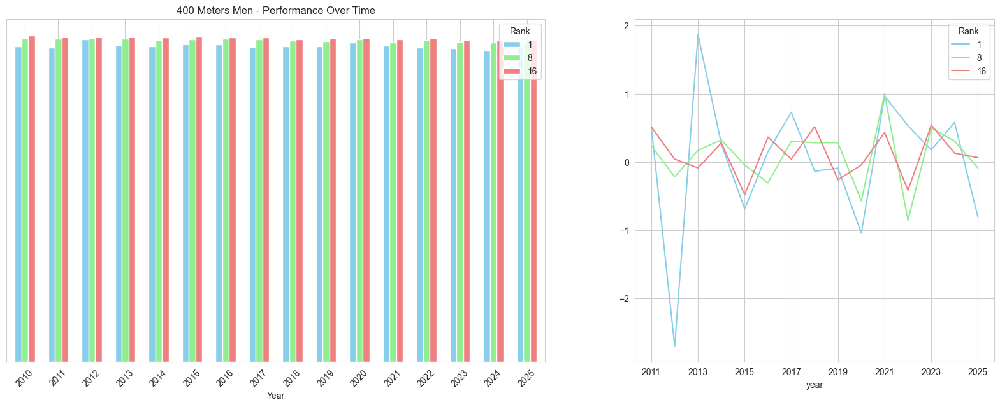

...

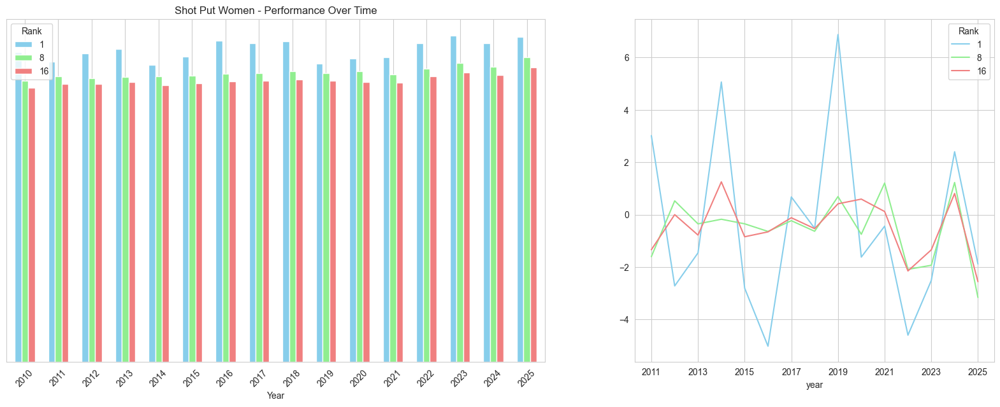

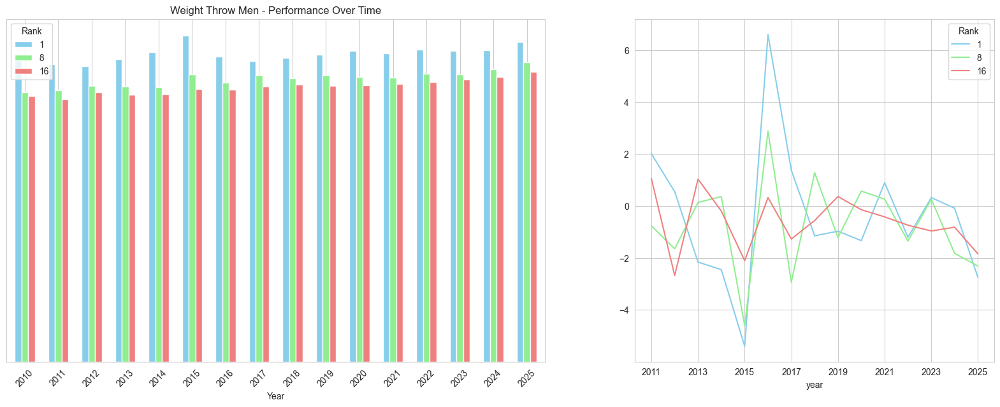

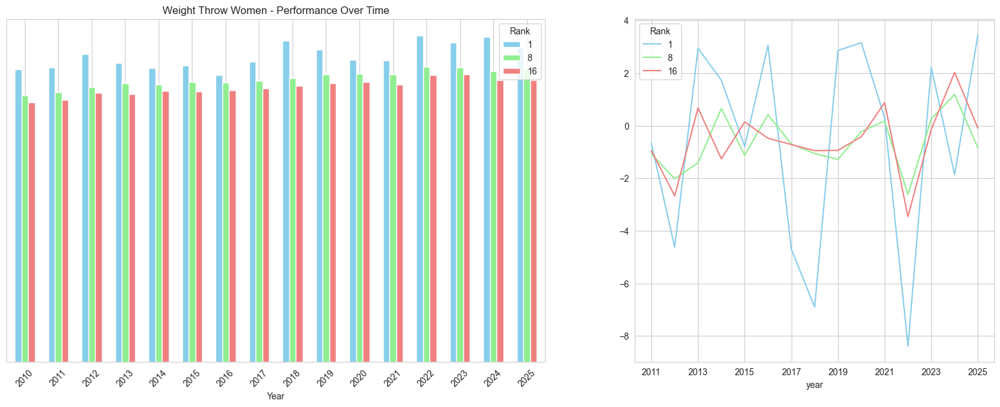

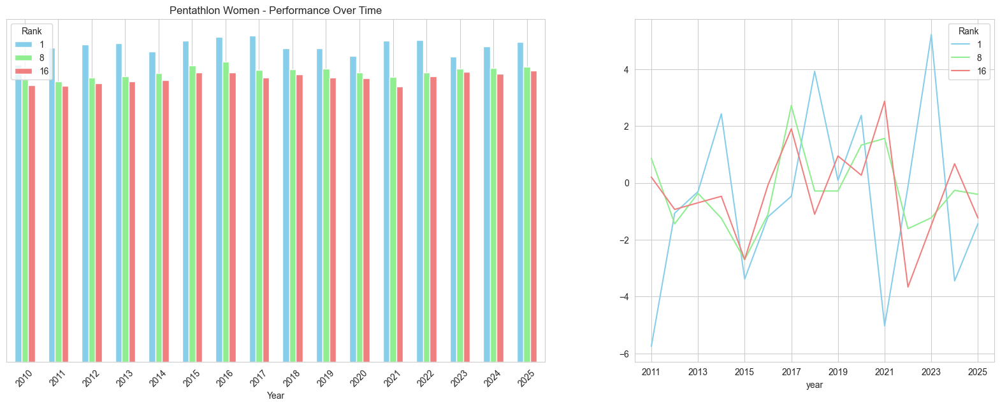

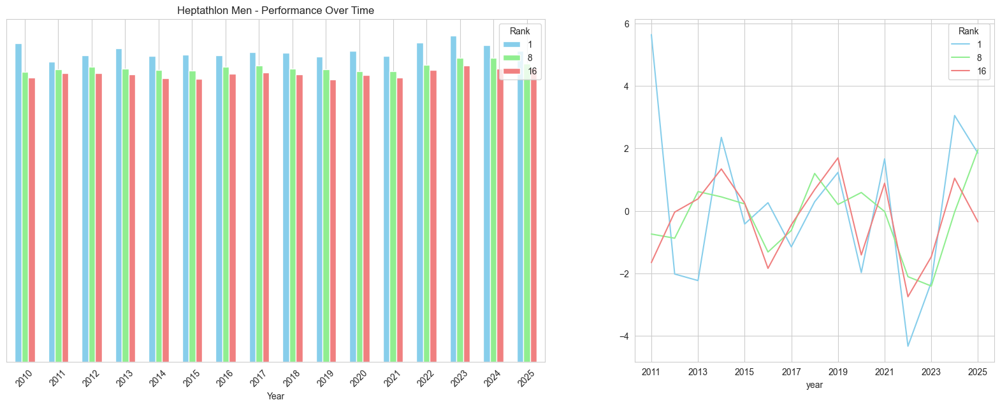

In [268]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style
sns.set_style("whitegrid")

# Add a 'place' column to each dataframe
df_1_place["Rank"] = 1
df_8_place["Rank"] = 8
df_16_place["Rank"] = 16

# Concatenate the dataframes
df_combined = pd.concat([df_1_place, df_8_place, df_16_place], ignore_index=True)

# Loop through each unique event
for event in df_combined["event"].unique():
    print(event)

    # Filter data for the specific event
    event_df = df_combined[df_combined["event"] == event].copy()

    # Convert marks based on event type
    event_df["mark_new"] = event_df.apply(
        lambda row: add_time_in_seconds(row["mark"])
        if row["event_type"] == "running"
        else get_meters(row["mark"])
        if row["event_type"] == "field"
        else get_points(row["mark"])
        if row["event_type"] == "athlon"
        else row["mark"],  # Leave mark unchanged for athlon events
        axis=1,
    )

    # Sort by year to ensure correct % change calculation
    event_df = event_df.sort_values(by=["Rank", "year"]).reset_index(drop=True)

    # Calculate % improvement (negative means better performance)
    event_df["pct_improvement"] = event_df["mark_new"].pct_change() * 100 * -1

    # Pivot the dataframe to have separate columns for each place
    event_df_pivoted = event_df.pivot(index="year", columns="Rank", values="mark_new")
    event_df_pct_pivoted = event_df[event_df["year"] != "2010"].pivot(
        index="year", columns="Rank", values="pct_improvement"
    )

    # Create subplots: (1) Bar chart for "mark_new" and (2) Line chart for % improvement
    fig, (ax1, ax2) = plt.subplots(
        1, 2, figsize=(20, 7), gridspec_kw={"width_ratios": [1.5, 1]}
    )

    # Bar chart (Performance Over Time), colored by 'place'
    event_df_pivoted.plot(
        kind="bar", ax=ax1, width=0.6, color=["skyblue", "lightgreen", "lightcoral"]
    )

    # ax2.plot(event_df["year"], event_df["pct_improvement"], marker="o", color="red", linestyle="dashed", label="% Improvement from Previous Year")
    event_df_pct_pivoted.plot(
        kind="line", ax=ax2, color=["skyblue", "lightgreen", "lightcoral"]
    )

    # # Label bars with mark values
    # for i, row in event_df_pivoted.iterrows():
    #     for place in [1,8,16]:
    #         ax1.text(i, row[place], row[place],
    #                 ha='center', va='bottom', fontsize=10, color="black")

    # Bar chart formatting
    ax1.set_ylabel("")  # Remove y-axis labels
    ax1.set_xlabel("Year")
    ax1.set_title(f"{event.replace('_', ' ').title()} - Performance Over Time")
    ax1.set_xticks(range(len(event_df_pivoted.index)))
    ax1.set_xticklabels(event_df_pivoted.index, rotation=45)
    ax1.set_yticks([])  # Remove y-axis ticks

    # Line chart
